<a href="https://www.kaggle.com/code/dataranch/us-macroeconomics-xgboost-fastai-eda?scriptVersionId=107523363" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**US Macroeconomic Stats Model Comparison + Feature Importance 📊**</div>
- Preprocessing
    - Detect continuous and categorical variables.
    - Normalize and impute data.
    

- For every target variable in the dataset:
    - Compare performance on 27 models + a TabNet model.
    - Output model performance and processed data in CSV format for every dataset.
    - Save plots + CSVs of XGBoost Feature Importances.
    - Save best performing FastAI model.

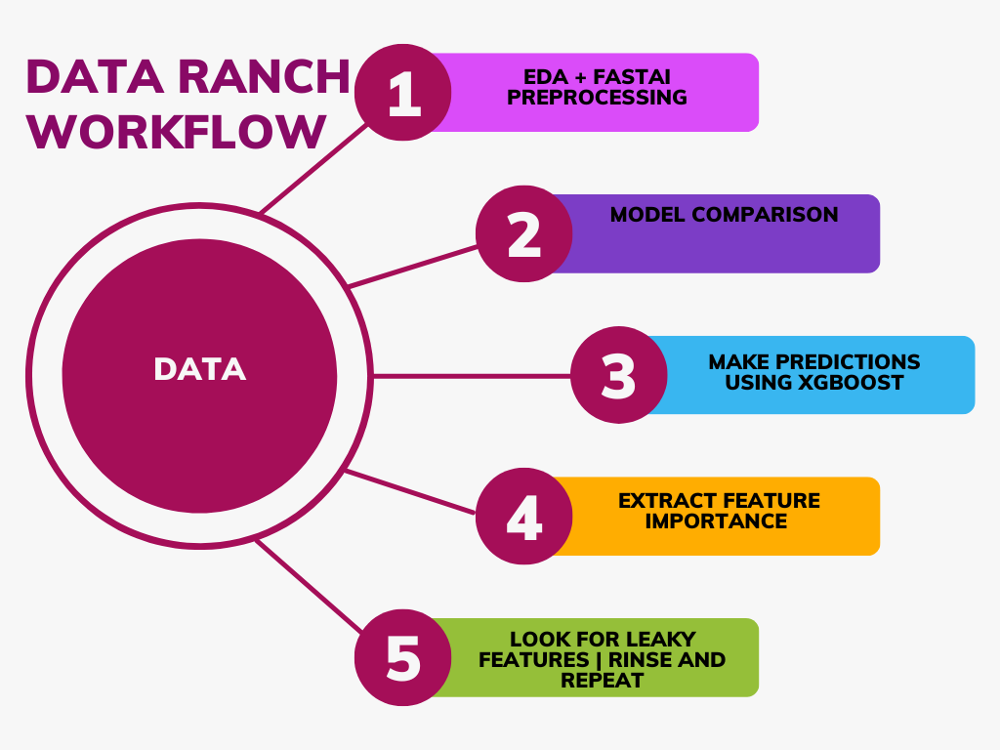

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
!pip install lazypredict

In [3]:
!pip install --upgrade pandas

In [4]:
!pip install fast-tabnet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.3 MB/s eta 0:00:00


In [5]:
!pip install fastai

  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.3.0
    Uninstalling typing_extensions-4.3.0:
      Successfully uninstalled typing_extensions-4.3.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-io 0.21.0 requires tensorflow-io-gcs-filesystem==0.21.0, which is not installed.
tensorflow 2.6.4 requires h5py~=3.1.0, but you have h5py 3.7.0 which is incompatible.
tensorflow 2.6.4 requires numpy~=1.19.2, but you have numpy 1.21.6 which is incompatible.
tensorflow 2.6.4 requires tensorboard<2.7,>=2.6.0, but you have tensorboard 2.10.0 which is incompatible.
tensorflow 2.6.4 requires typing-extensions<3.11,>=3.7, but you have typing-extensions 4.1.1 which is incompatible.
tensorflow-transform 1.9.0 requires pyarrow<6,>=1, but you have pyarrow 8.0.0 which is incompatible.
tensorflow-transform 1.9.0 requires te

In [6]:
!pip install pandas-profiling

  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
beatrix-jupyterlab 3.1.7 requires google-cloud-bigquery-storage, which is not installed.
werkzeug 2.2.2 requires MarkupSafe>=2.1.1, but you have markupsafe 2.0.1 which is incompatible.


In [7]:
#A program that takes a csv and trains models on it. Streamlined model selection.
#==============================================================================

#LazyPredict
import lazypredict
from lazypredict.Supervised import LazyRegressor
from lazypredict.Supervised import LazyClassifier
#Baysian Optimization
from bayes_opt import BayesianOptimization
#Pandas stack
import pandas as pd
import pandas_profiling
import numpy as np
#FastAI
from fastai.tabular.all import *
from fastai.tabular.core import *
#Plots
import matplotlib.pyplot as plt
import seaborn as sns
#System
import os
import sys
import traceback
#Fit an xgboost model
from xgboost import XGBRegressor
from xgboost import XGBClassifier
from xgboost import plot_importance
from sklearn.metrics import mean_squared_error
from sklearn.metrics import roc_auc_score
#Random
import random

#TabNet
from fast_tabnet.core import *

import shutil

In [8]:
%matplotlib inline

In [9]:
# For Styling
plt.style.use('seaborn-bright')

In [10]:
#Project Variables
#===================================================================================================
PROJECT_NAME = 'macroeconomic-factors-affecting-us-housing-prices'
VARIABLE_FILES = False
#Maximum amount of rows to take
SAMPLE_COUNT = 20000
FASTAI_LEARNING_RATE = 1e-1
AUTO_ADJUST_LEARNING_RATE = False
#Set to True automatically infer if variables are categorical or continuous
ENABLE_BREAKPOINT = True
#When trying to declare a column a continuous variable, if it fails, convert it to a categorical variable
CONVERT_TO_CAT = False
REGRESSOR = True
SEP_DOLLAR = False
SEP_COMMA = True
SHUFFLE_DATA = True

In [11]:
input_dir = f'../input/{PROJECT_NAME}'
param_dir = f'/kaggle/working/{PROJECT_NAME}'
TARGET = ''
PARAM_DIR = param_dir
print(f'param_dir: {param_dir}')
if not os.path.exists(param_dir):
    os.makedirs(param_dir)
#rename any file in param_dir/file that ends with csv to data.csv
for file in os.listdir(input_dir):
    if file.endswith('.csv'):
        print('CSV!')
        if 'classification_results' not in file and 'regression_results' not in file:
            #os.rename(f'{input_dir}/{file}', f'{param_dir}/data.csv')
            shutil.copy(f'{input_dir}/{file}', f'{param_dir}/data.csv')
        #os.rename(f'{param_dir}/{file}', f'{param_dir}/data.csv')
try:
    df = pd.read_csv(f'{param_dir}/data.csv', nrows=SAMPLE_COUNT)
except:
    print(f'Please place a file named data.csv in {param_dir}')
    #sys.exit()

param_dir: /kaggle/working/macroeconomic-factors-affecting-us-housing-prices
CSV!


In [12]:
df

,DATE,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA
0,01-05-2022,3.60,106.40,352.86,123.32,8.58,5.23,NaN,4.13,8.40,NaN,74737,19699.47,-0.14,120.72
1,01-04-2022,3.60,107.30,343.73,121.98,8.26,4.98,NaN,3.76,8.40,NaN,74737,19699.47,-0.14,121.81
2,01-03-2022,3.60,107.20,345.85,121.30,8.54,4.17,NaN,3.43,7.00,NaN,73289,19727.92,-0.40,122.89
3,01-02-2022,3.80,110.50,343.58,119.70,7.87,3.76,NaN,3.25,6.00,NaN,73289,19727.92,-0.40,123.83
4,01-01-2022,4.00,113.80,345.74,118.62,7.48,3.44,NaN,2.93,5.70,NaN,73289,19727.92,-0.40,124.78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,01-09-2002,5.70,94.50,145.40,76.37,1.51,6.09,42409.00,6.15,3.90,66.59,38099,13531.74,0.40,284.77
237,01-08-2002,5.70,97.40,145.10,76.24,1.80,6.29,42409.00,6.37,4.00,66.59,38099,13531.74,0.40,290.37
238,01-07-2002,5.80,106.30,144.70,75.99,1.46,6.49,42409.00,6.53,4.20,66.59,38099,13531.74,0.40,296.50
239,01-06-2002,5.80,110.30,144.30,75.90,1.07,6.65,42409.00,6.63,4.20,66.59,37860,13477.36,0.62,301.70


In [13]:
if SEP_DOLLAR:
    #For every column in df, if the column contains a $, make a new column with the value without the $
    for col in df.columns:
        if '$' in df[col].to_string():
            df[col + '_no_dollar'] = df[col].str.replace('$', '').str.replace(',', '')
            #Try to convert this new column to a numeric type
            try:
                df[col + '_no_dollar'] = df[col + '_no_dollar'].apply(pd.to_numeric, errors='coerce').dropna()
            except Exception:
                print(f'{col} can not be converted to a float!')


if SEP_COMMA:
    #For every column in df, if the column contains a %, make a new column with the value without the %
    for col in df.columns:
        if '%' in df[col].to_string() or ',' in df[col].to_string():
            df[col + '_processed'] = df[col].str.replace('%', '').str.replace(',', '')
            #Try to convert this new column to a numeric type
            try:
                df[col + '_processed'] = df[col + '_processed'].apply(pd.to_numeric, errors='coerce').dropna()
            except Exception:
                print(f'{col} can not be converted to a float!')

In [14]:
df

,DATE,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA
0,01-05-2022,3.60,106.40,352.86,123.32,8.58,5.23,NaN,4.13,8.40,NaN,74737,19699.47,-0.14,120.72
1,01-04-2022,3.60,107.30,343.73,121.98,8.26,4.98,NaN,3.76,8.40,NaN,74737,19699.47,-0.14,121.81
2,01-03-2022,3.60,107.20,345.85,121.30,8.54,4.17,NaN,3.43,7.00,NaN,73289,19727.92,-0.40,122.89
3,01-02-2022,3.80,110.50,343.58,119.70,7.87,3.76,NaN,3.25,6.00,NaN,73289,19727.92,-0.40,123.83
4,01-01-2022,4.00,113.80,345.74,118.62,7.48,3.44,NaN,2.93,5.70,NaN,73289,19727.92,-0.40,124.78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,01-09-2002,5.70,94.50,145.40,76.37,1.51,6.09,42409.00,6.15,3.90,66.59,38099,13531.74,0.40,284.77
237,01-08-2002,5.70,97.40,145.10,76.24,1.80,6.29,42409.00,6.37,4.00,66.59,38099,13531.74,0.40,290.37
238,01-07-2002,5.80,106.30,144.70,75.99,1.46,6.49,42409.00,6.53,4.20,66.59,38099,13531.74,0.40,296.50
239,01-06-2002,5.80,110.30,144.30,75.90,1.07,6.65,42409.00,6.63,4.20,66.59,37860,13477.36,0.62,301.70


In [15]:
df.isna().sum()

DATE                              0
UNRATE(%)                         0
CONSUMER CONF INDEX               0
PPI-CONST MAT.                    0
CPIALLITEMS                       0
INFLATION(%)                      0
MORTGAGE INT. MONTHLY AVG(%)      0
MED HOUSEHOLD INCOME             17
CORP. BOND YIELD(%)               0
MONTHLY HOME SUPPLY               0
% SHARE OF WORKING POPULATION     5
GDP PER CAPITA                    0
QUARTERLY REAL GDP                0
QUARTERLY GDP GROWTH RATE (%)     0
CSUSHPISA                         0
dtype: int64

In [16]:
df.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:>

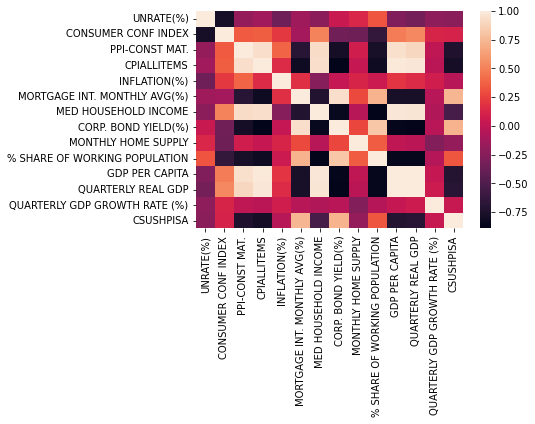

In [17]:
sns.heatmap(df.corr())

In [18]:
df.head().style.background_gradient(cmap = "inferno")

,DATE,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA
0,01-05-2022,3.60,106.40,352.86,123.32,8.58,5.23,nan,4.13,8.40,nan,74737,19699.47,-0.14,120.72
1,01-04-2022,3.60,107.30,343.73,121.98,8.26,4.98,nan,3.76,8.40,nan,74737,19699.47,-0.14,121.81
2,01-03-2022,3.60,107.20,345.85,121.30,8.54,4.17,nan,3.43,7.00,nan,73289,19727.92,-0.40,122.89
3,01-02-2022,3.80,110.50,343.58,119.70,7.87,3.76,nan,3.25,6.00,nan,73289,19727.92,-0.40,123.83
4,01-01-2022,4.00,113.80,345.74,118.62,7.48,3.44,nan,2.93,5.70,nan,73289,19727.92,-0.40,124.78


In [19]:
df.describe().T.style.background_gradient(cmap = "viridis")

,count,mean,std,min,25%,50%,75%,max
UNRATE(%),241.00,6.07,1.99,3.50,4.70,5.60,7.30,14.70
CONSUMER CONF INDEX,241.00,90.81,25.87,25.00,70.40,94.50,108.20,138.40
PPI-CONST MAT.,241.00,206.95,40.48,143.80,183.30,206.20,221.70,352.86
CPIALLITEMS,241.00,95.54,11.09,75.86,87.72,96.82,103.26,123.32
INFLATION(%),241.00,2.30,1.64,-2.10,1.46,2.07,2.97,8.58
MORTGAGE INT. MONTHLY AVG(%),241.00,4.70,1.12,2.68,3.80,4.46,5.81,6.81
MED HOUSEHOLD INCOME,224.00,53273.98,7475.32,42409.00,49007.25,50303.00,59039.00,68703.00
CORP. BOND YIELD(%),241.00,4.47,1.08,2.14,3.69,4.34,5.41,6.75
MONTHLY HOME SUPPLY,241.00,5.97,1.90,3.30,4.60,5.50,6.70,12.20
% SHARE OF WORKING POPULATION,236.00,66.41,0.80,64.92,65.62,66.74,67.13,67.30


In [20]:
df.columns

Index(['DATE', 'UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.',
       'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)',
       'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY',
       '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP',
       'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA'],
      dtype='object')

In [21]:
#remove features we don't want to make a prediction on
del(df['DATE'])

Target Variable: CSUSHPISA
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)']
Categorical variables that made the cut : []
Tabular Object size: 241


  5%|▍         | 2/42 [00:00<00:02, 15.09it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9584693541584343, 'Adjusted R-Squared': 0.9425899895719533, 'RMSE': 7.480893389426041, 'Time taken': 0.09849786758422852}
{'Model': 'BaggingRegressor', 'R-Squared': 0.9885376575823535, 'Adjusted R-Squared': 0.9841549972461945, 'RMSE': 3.9301200107541163, 'Time taken': 0.03384089469909668}


 17%|█▋        | 7/42 [00:00<00:01, 29.26it/s]

{'Model': 'BayesianRidge', 'R-Squared': 0.8084254381166486, 'Adjusted R-Squared': 0.7351763409259554, 'RMSE': 16.06712023761319, 'Time taken': 0.027319669723510742}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.9783735186580419, 'Adjusted R-Squared': 0.9701045699096461, 'RMSE': 5.3983626438882775, 'Time taken': 0.011718988418579102}
{'Model': 'DummyRegressor', 'R-Squared': -8.314798273967305e-05, 'Adjusted R-Squared': -0.38246788103496354, 'RMSE': 36.710236, 'Time taken': 0.009055376052856445}
{'Model': 'ElasticNet', 'R-Squared': 0.7566213783831088, 'Adjusted R-Squared': 0.6635648465884152, 'RMSE': 18.109661669962684, 'Time taken': 0.010941267013549805}
{'Model': 'ElasticNetCV', 'R-Squared': 0.8051961791144189, 'Adjusted R-Squared': 0.7307123652464026, 'RMSE': 16.201971304350046, 'Time taken': 0.06555938720703125}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.9858766795976286, 'Adjusted R-Squared': 0.9804765865026043, 'RMSE': 4.362520984761696, 'Time taken': 0.011709213256835938}


 24%|██▍       | 10/42 [00:00<00:01, 22.91it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9966411302803834, 'Adjusted R-Squared': 0.9953568565640594, 'RMSE': 2.1274810617598447, 'Time taken': 0.14812803268432617}
{'Model': 'GammaRegressor', 'R-Squared': 0.7263753054104243, 'Adjusted R-Squared': 0.6217540986555865, 'RMSE': 19.202013386552782, 'Time taken': 0.012019634246826172}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.7236144095113148, 'Adjusted R-Squared': 0.6179375660891705, 'RMSE': 19.298645197713796, 'Time taken': 0.03746366500854492}


 31%|███       | 13/42 [00:00<00:01, 14.71it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9923563143637367, 'Adjusted R-Squared': 0.9894337286792831, 'RMSE': 3.209375492427312, 'Time taken': 0.1740281581878662}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9667555292295082, 'Adjusted R-Squared': 0.9540444080525555, 'RMSE': 6.693123445422902, 'Time taken': 0.11841058731079102}
{'Model': 'HuberRegressor', 'R-Squared': 0.7950607690737195, 'Adjusted R-Squared': 0.7167016513666122, 'RMSE': 16.61811171787996, 'Time taken': 0.04470419883728027}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9920075892562437, 'Adjusted R-Squared': 0.988951667501278, 'RMSE': 3.2817693, 'Time taken': 0.011215686798095703}


 40%|████      | 17/42 [00:00<00:01, 18.09it/s]

{'Model': 'KernelRidge', 'R-Squared': -22.88816168893054, 'Adjusted R-Squared': -32.02187056999222, 'RMSE': 179.41571830752753, 'Time taken': 0.0331723690032959}
{'Model': 'Lars', 'R-Squared': -4.952398078993467, 'Adjusted R-Squared': -7.228314991549793, 'RMSE': 89.56021080326997, 'Time taken': 0.05712747573852539}
{'Model': 'LarsCV', 'R-Squared': 0.7534950968500536, 'Adjusted R-Squared': 0.6592432221162505, 'RMSE': 18.225602926960804, 'Time taken': 0.06609725952148438}
{'Model': 'Lasso', 'R-Squared': 0.7970734285666563, 'Adjusted R-Squared': 0.7194838571362602, 'RMSE': 16.536309118025034, 'Time taken': 0.009874582290649414}


 48%|████▊     | 20/42 [00:01<00:01, 16.17it/s]

{'Model': 'LassoCV', 'R-Squared': 0.8358586260395844, 'Adjusted R-Squared': 0.7730986889370726, 'RMSE': 14.872300619321749, 'Time taken': 0.15254926681518555}
{'Model': 'LassoLars', 'R-Squared': 0.4724008555335053, 'Adjusted R-Squared': 0.2706717708845514, 'RMSE': 26.663746059051412, 'Time taken': 0.010853767395019531}
{'Model': 'LassoLarsCV', 'R-Squared': 0.8296663965482385, 'Adjusted R-Squared': 0.7645388422872709, 'RMSE': 15.150232240717116, 'Time taken': 0.03509402275085449}
{'Model': 'LassoLarsIC', 'R-Squared': 0.8296663965482385, 'Adjusted R-Squared': 0.7645388422872709, 'RMSE': 15.150232240717116, 'Time taken': 0.015478134155273438}
{'Model': 'LinearRegression', 'R-Squared': 0.8296663965482414, 'Adjusted R-Squared': 0.7645388422872749, 'RMSE': 15.150232240716992, 'Time taken': 0.009628534317016602}
{'Model': 'LinearSVR', 'R-Squared': 0.408416113470371, 'Adjusted R-Squared': 0.18222227450315986, 'RMSE': 28.234317318031167, 'Time taken': 0.009514570236206055}


 74%|███████▍  | 31/42 [00:01<00:00, 16.52it/s]

{'Model': 'MLPRegressor', 'R-Squared': -16.588469169391274, 'Adjusted R-Squared': -23.3134720870997, 'RMSE': 153.95122328409659, 'Time taken': 0.5225281715393066}
{'Model': 'NuSVR', 'R-Squared': 0.45703119975506024, 'Adjusted R-Squared': 0.249425482014348, 'RMSE': 27.049333019402255, 'Time taken': 0.024709463119506836}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.5470129624263633, 'Adjusted R-Squared': 0.37381203629526694, 'RMSE': 24.70654461736024, 'Time taken': 0.01987624168395996}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7933846140771726, 'Adjusted R-Squared': 0.714384613577268, 'RMSE': 16.685931355182692, 'Time taken': 0.029546022415161133}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.7066539252790767, 'Adjusted R-Squared': 0.5944921908269589, 'RMSE': 19.88196311881483, 'Time taken': 0.02241349220275879}
{'Model': 'PoissonRegressor', 'R-Squared': 0.8412919166310593, 'Adjusted R-Squared': 0.7806094141664643, 'RMSE': 14.62408311481225, 'Time taken': 

 81%|████████  | 34/42 [00:03<00:01,  7.41it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9864605303493381, 'Adjusted R-Squared': 0.981283674306438, 'RMSE': 4.271397112716922, 'Time taken': 0.21870684623718262}
{'Model': 'Ridge', 'R-Squared': 0.8196653409565113, 'Adjusted R-Squared': 0.7507138536751774, 'RMSE': 15.58865784151422, 'Time taken': 0.012820959091186523}
{'Model': 'RidgeCV', 'R-Squared': 0.8375012768292037, 'Adjusted R-Squared': 0.7753694120874287, 'RMSE': 14.797695952178147, 'Time taken': 0.010333061218261719}
{'Model': 'SGDRegressor', 'R-Squared': 0.8039646290504326, 'Adjusted R-Squared': 0.7290099283932452, 'RMSE': 16.25310505887558, 'Time taken': 0.010866880416870117}
{'Model': 'SVR', 'R-Squared': 0.5229835128342059, 'Adjusted R-Squared': 0.34059485597669636, 'RMSE': 25.35337722094686, 'Time taken': 0.012966632843017578}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.8296663965482414, 'Adjusted R-Squared': 0.7645388422872749, 'RMSE': 15.150232240716992, 'Time taken': 0.00998997688293457}
{'Model': 'Twe

100%|██████████| 42/42 [00:03<00:00, 11.68it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9895632486931604, 'Adjusted R-Squared': 0.9855727261346628, 'RMSE': 3.7501774, 'Time taken': 0.44019532203674316}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9555170377473066, 'Adjusted R-Squared': 0.9385088462977473, 'RMSE': 7.742228299388794, 'Time taken': 0.07480454444885254}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: CSUSHPISA
CSUSHPISA
Target Standard Deviation: 36.70298385620117
                               Adjusted R-Squared  R-Squared   RMSE  \
Model                                                                 
ExtraTreesRegressor                          1.00       1.00   2.13   
GradientBoostingRegressor                    0.99       0.99   3.21   
KNeighborsRegressor                          0.99       0.99   3.28   
XGBRegressor                                 0.99       0.99   3.75   
BaggingRegressor                             0.98       0.99   3.93   
Ra

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,32015.582031,30070.681641,173.408997,00:00
1,31043.570312,21674.373047,147.222183,00:00
2,29174.578125,10422.719727,102.091721,00:00
3,26183.130859,110333.789062,332.165314,00:00


Better model found at epoch 0 with _rmse value: 173.40899658203125.
Better model found at epoch 1 with _rmse value: 147.22218322753906.
Better model found at epoch 2 with _rmse value: 102.09172058105469.
No improvement since epoch 2: early stopping


,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,CSUSHPISA_pred
0,-0.15,-0.39,-1.56,-1.70,0.23,1.06,-0.41,1.56,-1.02,0.16,-1.63,-1.72,-0.02,270.26,145.41
1,0.00,-0.21,0.22,0.49,-0.09,-0.48,0.28,-0.22,-0.14,0.11,0.24,0.23,0.52,146.40,18.22
2,0.16,-0.05,1.28,1.39,-0.51,-1.74,-3.29,-1.89,-1.02,-0.06,1.60,1.54,0.69,136.29,190.55
3,1.96,-1.49,-0.42,-0.37,0.31,0.19,0.02,0.71,1.06,0.21,-0.59,-0.66,0.37,166.65,114.79
4,0.88,-0.73,-0.01,0.22,-0.04,-1.17,0.10,-0.95,-0.55,0.17,-0.07,-0.11,-0.30,136.68,55.18
5,-1.28,0.66,3.49,2.45,3.72,0.24,-3.29,-0.68,1.26,-7.92,2.56,1.92,-0.48,121.81,372.66
6,0.73,-0.57,0.09,0.28,-0.53,-1.03,0.27,-0.56,-0.71,0.14,0.01,-0.01,-0.28,139.90,31.80
7,-0.87,1.17,0.77,1.26,-0.42,-1.11,1.20,-1.36,0.28,-0.04,1.41,1.48,-1.28,151.34,150.90
8,-0.51,-1.03,-0.46,-0.47,1.09,1.11,0.05,0.95,2.35,0.22,-0.48,-0.47,-0.66,180.85,143.09


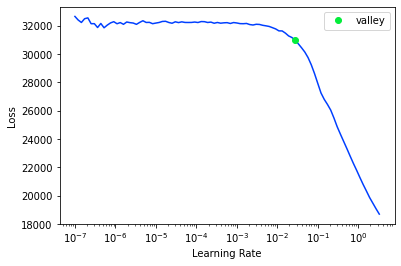

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0  180.85     176.12
1  184.36     179.97
2  163.40     166.48
3  147.78     150.59
4  124.78     124.36
XGBoost RMSE:  3.750183


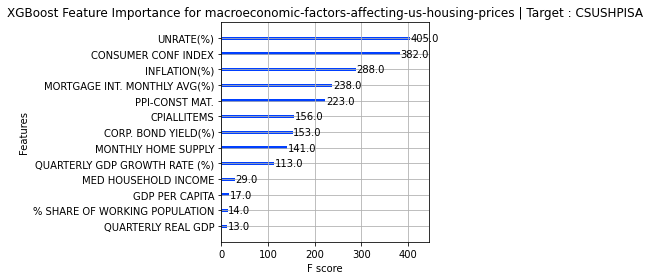

Target Variable: QUARTERLY GDP GROWTH RATE (%)
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


  5%|▍         | 2/42 [00:00<00:02, 15.02it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': -0.014412657375274751, 'Adjusted R-Squared': -0.40227632048935047, 'RMSE': 2.595137461717949, 'Time taken': 0.09548783302307129}
{'Model': 'BaggingRegressor', 'R-Squared': -0.11991623923919748, 'Adjusted R-Squared': -0.5481195071835965, 'RMSE': 2.7267530540902842, 'Time taken': 0.03725409507751465}


 17%|█▋        | 7/42 [00:00<00:01, 25.44it/s]

{'Model': 'BayesianRidge', 'R-Squared': -0.6741760773342873, 'Adjusted R-Squared': -1.3143022245503384, 'RMSE': 3.3339079380327568, 'Time taken': 0.011877059936523438}
{'Model': 'DecisionTreeRegressor', 'R-Squared': -0.07958659213293284, 'Adjusted R-Squared': -0.4923697008896424, 'RMSE': 2.6772059299180593, 'Time taken': 0.012668371200561523}
{'Model': 'DummyRegressor', 'R-Squared': -0.050246391014574954, 'Adjusted R-Squared': -0.4518111875789712, 'RMSE': 2.640576, 'Time taken': 0.009779691696166992}
{'Model': 'ElasticNet', 'R-Squared': -0.05024643235955639, 'Adjusted R-Squared': -0.4518112447323279, 'RMSE': 2.640575835481684, 'Time taken': 0.010507583618164062}
{'Model': 'ElasticNetCV', 'R-Squared': -0.683842551591066, 'Adjusted R-Squared': -1.327664703670003, 'RMSE': 3.3435188596940444, 'Time taken': 0.11185288429260254}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.16873764281956782, 'Adjusted R-Squared': -0.1490979643376562, 'RMSE': 2.349211371279492, 'Time taken': 0.0131108760833

 24%|██▍       | 10/42 [00:00<00:01, 21.60it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': -0.5634395966585339, 'Adjusted R-Squared': -1.1612253247926794, 'RMSE': 3.221763007865302, 'Time taken': 0.14855098724365234}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': -0.036280107405582074, 'Adjusted R-Squared': -0.43250485435477515, 'RMSE': 2.6229596993545354, 'Time taken': 0.04023313522338867}


 31%|███       | 13/42 [00:00<00:02, 14.13it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': -0.10898437200347022, 'Adjusted R-Squared': -0.5330078083577383, 'RMSE': 2.7134120553782366, 'Time taken': 0.17827177047729492}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': -0.31531234065906855, 'Adjusted R-Squared': -0.8182258826757711, 'RMSE': 2.9550680378181062, 'Time taken': 0.12068295478820801}
{'Model': 'HuberRegressor', 'R-Squared': -0.18821950361954354, 'Adjusted R-Squared': -0.6425387255917219, 'RMSE': 2.8086742684499924, 'Time taken': 0.03660297393798828}
{'Model': 'KNeighborsRegressor', 'R-Squared': -0.4972917999771229, 'Adjusted R-Squared': -1.0697857234977874, 'RMSE': 3.1528714, 'Time taken': 0.010038614273071289}
{'Model': 'KernelRidge', 'R-Squared': -0.5646797940034347, 'Adjusted R-Squared': -1.162939715240042, 'RMSE': 3.2230405851602137, 'Time taken': 0.027289390563964844}


 48%|████▊     | 20/42 [00:01<00:01, 17.30it/s]

{'Model': 'Lars', 'R-Squared': -0.6160576332796774, 'Adjusted R-Squared': -1.2339620224748482, 'RMSE': 3.2755290814470834, 'Time taken': 0.049658775329589844}
{'Model': 'LarsCV', 'R-Squared': -0.5902863980911572, 'Adjusted R-Squared': -1.1983370797142467, 'RMSE': 3.2493067247142244, 'Time taken': 0.04910874366760254}
{'Model': 'Lasso', 'R-Squared': -0.05024643235955639, 'Adjusted R-Squared': -0.4518112447323279, 'RMSE': 2.640575835481684, 'Time taken': 0.011806249618530273}
{'Model': 'LassoCV', 'R-Squared': -0.6734420306522853, 'Adjusted R-Squared': -1.3132875129605117, 'RMSE': 3.3331769777705595, 'Time taken': 0.1229560375213623}
{'Model': 'LassoLars', 'R-Squared': -0.05024643235955639, 'Adjusted R-Squared': -0.4518112447323279, 'RMSE': 2.640575835481684, 'Time taken': 0.013170480728149414}
{'Model': 'LassoLarsCV', 'R-Squared': -0.6752634574171774, 'Adjusted R-Squared': -1.3158053676060981, 'RMSE': 3.3349904515995092, 'Time taken': 0.02884960174560547}
{'Model': 'LassoLarsIC', 'R-Squa

 71%|███████▏  | 30/42 [00:01<00:00, 16.93it/s]

{'Model': 'MLPRegressor', 'R-Squared': -1.0319127907884327, 'Adjusted R-Squared': -1.8088206225604804, 'RMSE': 3.6728701045069783, 'Time taken': 0.47029781341552734}
{'Model': 'NuSVR', 'R-Squared': -0.1387793072589507, 'Adjusted R-Squared': -0.5741949247403142, 'RMSE': 2.7496209027124134, 'Time taken': 0.031243324279785156}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': -0.06420902473620815, 'Adjusted R-Squared': -0.4711124753706406, 'RMSE': 2.658070563519031, 'Time taken': 0.019633769989013672}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': -0.5171894312348233, 'Adjusted R-Squared': -1.0972912725893145, 'RMSE': 3.1737516636782206, 'Time taken': 0.03175997734069824}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': -0.1279210148128609, 'Adjusted R-Squared': -0.5591849322413076, 'RMSE': 2.7364806485289046, 'Time taken': 0.02123403549194336}
PoissonRegressor model failed to execute
Some value(s) of y are out of the valid range for family PoissonDistribution


 79%|███████▊  | 33/42 [00:03<00:01,  6.25it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.048983477718834045, 'Adjusted R-Squared': -0.450065395670153, 'RMSE': 2.638987669792607, 'Time taken': 1.2401926517486572}
{'Model': 'RANSACRegressor', 'R-Squared': -0.3660920315253402, 'Adjusted R-Squared': -0.8884213376967938, 'RMSE': 3.0115703743254802, 'Time taken': 0.14607787132263184}


 83%|████████▎ | 35/42 [00:03<00:01,  6.50it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': -0.16861947591183224, 'Adjusted R-Squared': -0.6154445696428268, 'RMSE': 2.785412993054068, 'Time taken': 0.24379324913024902}
{'Model': 'Ridge', 'R-Squared': -0.6689427066799876, 'Adjusted R-Squared': -1.3070678592341003, 'RMSE': 3.3286930647089363, 'Time taken': 0.009944438934326172}
{'Model': 'RidgeCV', 'R-Squared': -0.6689427066799241, 'Adjusted R-Squared': -1.3070678592340128, 'RMSE': 3.3286930647088733, 'Time taken': 0.010802030563354492}
{'Model': 'SGDRegressor', 'R-Squared': -0.4568950648788137, 'Adjusted R-Squared': -1.013943177920713, 'RMSE': 3.1100485824798603, 'Time taken': 0.01017618179321289}
{'Model': 'SVR', 'R-Squared': -0.13645014928721144, 'Adjusted R-Squared': -0.5709752063676159, 'RMSE': 2.7468075483362093, 'Time taken': 0.012293577194213867}
{'Model': 'TransformedTargetRegressor', 'R-Squared': -0.660421378145617, 'Adjusted R-Squared': -1.2952883756718823, 'RMSE': 3.3201843285064303, 'Time taken': 0.009868383407592773}

100%|██████████| 42/42 [00:03<00:00, 10.64it/s]

{'Model': 'XGBRegressor', 'R-Squared': -0.0449096152884616, 'Adjusted R-Squared': -0.4444338799575793, 'RMSE': 2.6338582, 'Time taken': 0.4094545841217041}
{'Model': 'LGBMRegressor', 'R-Squared': -0.39227863013154285, 'Adjusted R-Squared': -0.9246204592994858, 'RMSE': 3.040297733940259, 'Time taken': 0.045300960540771484}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: QUARTERLY GDP GROWTH RATE (%)
QUARTERLY GDP GROWTH RATE (%)
Target Standard Deviation: 0.954474925994873
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreeRegressor                          -0.15       0.17  2.35        0.01
AdaBoostRegressor                           -0.40      -0.01  2.60        0.10
GaussianProcessRegressor                    -0.43      -0.04  2.62        0.04
XGBRegressor                                -0.44      -0.0

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,5.576236,100.827820,10.041306,00:00
1,4.969996,31.775726,5.636996,00:00
2,4.614361,45.335236,6.733145,00:00


Better model found at epoch 0 with _rmse value: 10.041305541992188.
Better model found at epoch 1 with _rmse value: 5.636996269226074.
No improvement since epoch 1: early stopping


,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,CSUSHPISA,QUARTERLY GDP GROWTH RATE (%),QUARTERLY GDP GROWTH RATE (%)_pred
0,-0.78,0.87,-0.53,-0.66,-0.22,1.63,0.11,1.18,1.62,0.24,-0.48,-0.46,0.31,0.60,6.67
1,-0.19,0.31,-1.45,-1.68,-0.32,1.38,-0.39,1.72,-1.06,0.17,-1.61,-1.71,3.08,0.40,-0.01
2,3.84,-0.10,0.64,1.17,-1.31,-1.36,1.21,-1.90,-0.39,0.03,0.69,0.46,-0.75,-8.94,-4.67
3,-1.21,1.34,0.76,1.09,-0.29,-0.43,1.29,-0.71,-0.14,0.03,1.24,1.38,-0.08,0.60,-3.65
4,-0.62,0.45,0.23,0.59,-0.76,-1.17,0.67,-1.14,-0.55,0.11,0.58,0.73,-0.12,0.60,5.15
5,-0.73,0.86,0.26,0.66,0.09,-0.53,0.81,-0.57,-0.34,0.08,0.69,0.83,0.04,0.47,-0.10
6,1.90,-1.00,-0.17,-0.27,-0.19,0.12,0.05,0.40,1.67,0.22,-0.46,-0.50,-0.33,0.97,-6.66
7,0.13,-0.24,0.19,0.48,-0.13,-0.50,0.33,-0.35,-0.45,0.15,0.24,0.24,-0.79,1.28,0.43
8,0.02,-1.25,0.01,-0.23,1.78,1.55,0.11,1.04,2.70,0.23,-0.41,-0.44,0.05,-0.53,-2.33


<Figure size 432x288 with 0 Axes>

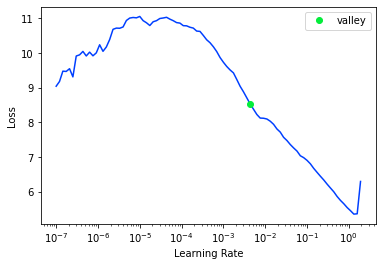

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    0.47       0.59
1    0.68       0.57
2   -0.53       0.24
3    0.15       0.24
4    0.25       1.06
XGBoost RMSE:  2.6337001


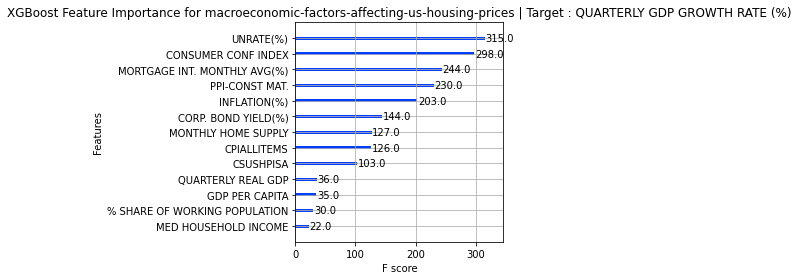

Target Variable: QUARTERLY REAL GDP
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


 14%|█▍        | 6/42 [00:00<00:00, 59.91it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9869816925803544, 'Adjusted R-Squared': 0.9820041044493134, 'RMSE': 179.80016371852284, 'Time taken': 0.02870917320251465}
{'Model': 'BaggingRegressor', 'R-Squared': 0.997271060372154, 'Adjusted R-Squared': 0.9962276422791541, 'RMSE': 82.3208384885405, 'Time taken': 0.031545400619506836}
{'Model': 'BayesianRidge', 'R-Squared': 0.9968957415840172, 'Adjusted R-Squared': 0.9957088192484943, 'RMSE': 87.79944183517766, 'Time taken': 0.010452032089233398}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.9988607204865312, 'Adjusted R-Squared': 0.9984251136137343, 'RMSE': 53.18975199482818, 'Time taken': 0.010346651077270508}
{'Model': 'DummyRegressor', 'R-Squared': -0.019427601560729535, 'Adjusted R-Squared': -0.4092087433339495, 'RMSE': 1591.0764, 'Time taken': 0.00883030891418457}
{'Model': 'ElasticNet', 'R-Squared': 0.9816690277706356, 'Adjusted R-Squared': 0.9746601266241139, 'RMSE': 213.35634905624707, 'Time taken': 0.00969696044921875}
{'Mo

 38%|███▊      | 16/42 [00:00<00:01, 20.32it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9993936525003768, 'Adjusted R-Squared': 0.9991618137505209, 'RMSE': 38.80374276166504, 'Time taken': 0.1751880645751953}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.998103532758205, 'Adjusted R-Squared': 0.9973784129304598, 'RMSE': 68.62549563599536, 'Time taken': 0.12016987800598145}
{'Model': 'HuberRegressor', 'R-Squared': 0.9971388254323149, 'Adjusted R-Squared': 0.9960448469211411, 'RMSE': 84.2917362173637, 'Time taken': 0.04139876365661621}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9976145398095392, 'Adjusted R-Squared': 0.9967024520896571, 'RMSE': 76.966, 'Time taken': 0.011016130447387695}
{'Model': 'KernelRidge', 'R-Squared': -109.68786127160483, 'Adjusted R-Squared': -152.0096905813361, 'RMSE': 16579.17132232398, 'Time taken': 0.02050328254699707}


 52%|█████▏    | 22/42 [00:00<00:00, 22.88it/s]

{'Model': 'Lars', 'R-Squared': 0.9969624781079626, 'Adjusted R-Squared': 0.9958010726786541, 'RMSE': 86.85054133231688, 'Time taken': 0.02509927749633789}
{'Model': 'LarsCV', 'R-Squared': 0.9902282113531323, 'Adjusted R-Squared': 0.9864919392234476, 'RMSE': 155.77575108755832, 'Time taken': 0.05528593063354492}
{'Model': 'Lasso', 'R-Squared': 0.9967171951645305, 'Adjusted R-Squared': 0.9954620050803804, 'RMSE': 90.28910615411229, 'Time taken': 0.024630069732666016}
{'Model': 'LassoCV', 'R-Squared': 0.9965760877046924, 'Adjusted R-Squared': 0.9952669447682513, 'RMSE': 92.20917516286656, 'Time taken': 0.07434487342834473}
{'Model': 'LassoLars', 'R-Squared': 0.9942134360647698, 'Adjusted R-Squared': 0.9920009263248287, 'RMSE': 119.87350374304383, 'Time taken': 0.011150360107421875}
{'Model': 'LassoLarsCV', 'R-Squared': 0.9969142432028477, 'Adjusted R-Squared': 0.9957343950157013, 'RMSE': 87.53740509999784, 'Time taken': 0.029518842697143555}
{'Model': 'LassoLarsIC', 'R-Squared': 0.9969040

 71%|███████▏  | 30/42 [00:01<00:00, 18.32it/s]

{'Model': 'MLPRegressor', 'R-Squared': -107.4531237307326, 'Adjusted R-Squared': -148.9204945689539, 'RMSE': 16410.954978559508, 'Time taken': 0.41881728172302246}
{'Model': 'NuSVR', 'R-Squared': -0.017252210801574686, 'Adjusted R-Squared': -0.40620158551982377, 'RMSE': 1589.3777998392875, 'Time taken': 0.025248050689697266}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.9660749466356515, 'Adjusted R-Squared': 0.9531036027022242, 'RMSE': 290.2505765715802, 'Time taken': 0.020312786102294922}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.996095114979517, 'Adjusted R-Squared': 0.9946020707069794, 'RMSE': 98.47294959062069, 'Time taken': 0.03155517578125}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.9931962291492296, 'Adjusted R-Squared': 0.9905947873533467, 'RMSE': 129.98333050607388, 'Time taken': 0.027872085571289062}
{'Model': 'PoissonRegressor', 'R-Squared': 0.9936049354459096, 'Adjusted R-Squared': 0.9911597637046397, 'RMSE': 126.01878490643631, 'Time take

 79%|███████▊  | 33/42 [00:03<00:01,  4.72it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.0014535242803268567, 'Adjusted R-Squared': -0.3843622247404519, 'RMSE': 1576.9873914198076, 'Time taken': 1.838332176208496}
{'Model': 'RANSACRegressor', 'R-Squared': -0.573754391977541, 'Adjusted R-Squared': -1.1754840124395418, 'RMSE': 1976.884512113294, 'Time taken': 0.08779549598693848}


 83%|████████▎ | 35/42 [00:03<00:01,  5.15it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.999376385512289, 'Adjusted R-Squared': 0.9991379446787525, 'RMSE': 39.35237240306445, 'Time taken': 0.23518657684326172}
{'Model': 'Ridge', 'R-Squared': 0.9944218995838904, 'Adjusted R-Squared': 0.9922890964836132, 'RMSE': 117.69445046021579, 'Time taken': 0.010818719863891602}
{'Model': 'RidgeCV', 'R-Squared': 0.9965989706361622, 'Adjusted R-Squared': 0.9952985770558713, 'RMSE': 91.90052918477353, 'Time taken': 0.011180400848388672}
{'Model': 'SGDRegressor', 'R-Squared': 0.9939471767215016, 'Adjusted R-Squared': 0.9916328619385463, 'RMSE': 122.60038062114246, 'Time taken': 0.03125143051147461}
{'Model': 'SVR', 'R-Squared': 0.021399308281637386, 'Adjusted R-Squared': -0.3527715444342072, 'RMSE': 1558.8903928531213, 'Time taken': 0.01296091079711914}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.996933917091507, 'Adjusted R-Squared': 0.9957615912735538, 'RMSE': 87.25790235167977, 'Time taken': 0.010071039199829102}
{'Model': 'Tw

100%|██████████| 42/42 [00:04<00:00,  9.15it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9989045352451862, 'Adjusted R-Squared': 0.998485681074228, 'RMSE': 52.156933, 'Time taken': 0.7355709075927734}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9979546055355488, 'Adjusted R-Squared': 0.9971725429461998, 'RMSE': 71.26911395447792, 'Time taken': 0.051776885986328125}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: QUARTERLY REAL GDP
QUARTERLY REAL GDP
Target Standard Deviation: 1732.7210693359375
                               Adjusted R-Squared  R-Squared     RMSE  \
Model                                                                   
GradientBoostingRegressor                    1.00       1.00    38.80   
RandomForestRegressor                        1.00       1.00    39.35   
ExtraTreesRegressor                          1.00       1.00    49.62   
XGBRegressor                                 1.00       1.00    52.16   
DecisionTreeRegressor                      

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,278004384.000000,269118944.000000,16404.845703,00:00
1,277949504.000000,268521760.000000,16386.632812,00:00
2,277508128.000000,264675888.000000,16268.862305,00:00
3,277020000.000000,256450624.000000,16014.076172,00:00
4,276235584.000000,241089712.000000,15527.063477,00:00
5,274691552.000000,220745536.000000,14857.507812,00:00
6,271956128.000000,199359168.000000,14119.460938,00:00
7,267929760.000000,184019152.000000,13565.366211,00:00
8,262319232.000000,168348272.000000,12974.909180,00:00
9,255136976.000000,133545480.000000,11556.187500,00:00


Better model found at epoch 0 with _rmse value: 16404.845703125.
Better model found at epoch 1 with _rmse value: 16386.6328125.
Better model found at epoch 2 with _rmse value: 16268.8623046875.
Better model found at epoch 3 with _rmse value: 16014.076171875.
Better model found at epoch 4 with _rmse value: 15527.0634765625.
Better model found at epoch 5 with _rmse value: 14857.5078125.
Better model found at epoch 6 with _rmse value: 14119.4609375.
Better model found at epoch 7 with _rmse value: 13565.3662109375.
Better model found at epoch 8 with _rmse value: 12974.9091796875.
Better model found at epoch 9 with _rmse value: 11556.1875.
Better model found at epoch 10 with _rmse value: 9786.0849609375.
Better model found at epoch 11 with _rmse value: 8598.9013671875.
Better model found at epoch 12 with _rmse value: 7709.1728515625.
Better model found at epoch 13 with _rmse value: 6690.5390625.
No improvement since epoch 13: early stopping


,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,QUARTERLY REAL GDP,QUARTERLY REAL GDP_pred
0,-0.84,1.10,0.36,0.68,-0.00,-0.54,0.72,-0.51,-0.24,-0.01,0.69,0.01,0.12,17996.80,7869.65
1,1.86,-1.47,-0.48,-0.42,-2.44,0.49,-0.04,0.77,0.92,0.22,-0.69,-0.13,-0.18,15216.65,9045.10
2,-1.26,0.56,3.74,2.52,4.22,0.53,-3.36,-0.27,1.41,-9.70,2.46,-0.48,-1.48,19699.46,12400.12
3,-1.31,1.54,0.68,1.20,0.19,-0.92,1.15,-1.37,-0.18,-0.09,1.33,-1.28,-0.58,18951.99,11399.78
4,-0.69,0.13,-0.60,-0.64,1.39,1.41,-0.00,0.94,1.96,0.24,-0.51,0.04,0.24,15767.15,7622.59
5,-0.43,0.48,-0.94,-1.28,0.63,1.16,-0.27,0.90,-0.95,0.22,-1.11,0.39,0.91,14767.85,10215.67
6,1.97,-1.78,-0.37,-0.38,-0.04,0.31,-0.07,0.85,1.36,0.22,-0.60,-0.03,-0.29,15456.06,9385.19
7,1.97,-1.47,-0.34,-0.30,-0.70,-0.31,-0.07,0.41,1.30,0.22,-0.43,-0.02,-0.42,15808.00,9777.17
8,-0.69,0.53,-0.60,-0.70,0.37,1.57,-0.00,1.21,1.85,0.24,-0.55,0.04,0.29,15671.61,7851.64


<Figure size 432x288 with 0 Axes>

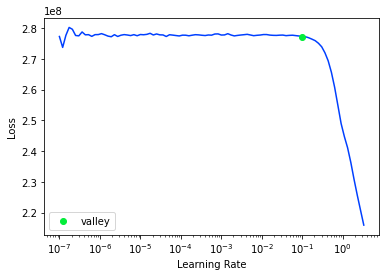

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
    actual  predicted
0 15244.09   15255.62
1 19055.65   19040.23
2 15792.77   15794.31
3 14212.34   14192.87
4 18951.99   18972.98
XGBoost RMSE:  52.154053


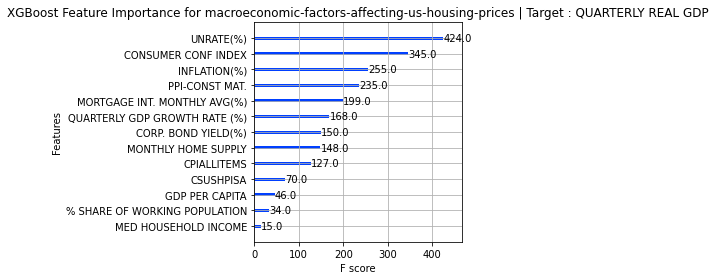

Target Variable: GDP PER CAPITA
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


  2%|▏         | 1/42 [00:00<00:04, 10.00it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9963149415081668, 'Adjusted R-Squared': 0.994905948555407, 'RMSE': 487.72538553343264, 'Time taken': 0.09991121292114258}
{'Model': 'BaggingRegressor', 'R-Squared': 0.9970219159153899, 'Adjusted R-Squared': 0.9958832367065684, 'RMSE': 438.45158631446054, 'Time taken': 0.033327341079711914}
{'Model': 'BayesianRidge', 'R-Squared': 0.9989142031975421, 'Adjusted R-Squared': 0.9984990455966023, 'RMSE': 264.7448051228961, 'Time taken': 0.011163473129272461}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.9975287276923492, 'Adjusted R-Squared': 0.996583829457071, 'RMSE': 399.404974096885, 'Time taken': 0.010400533676147461}


 17%|█▋        | 7/42 [00:00<00:01, 32.20it/s]

{'Model': 'DummyRegressor', 'R-Squared': -0.038544581374526876, 'Adjusted R-Squared': -0.4356351566059635, 'RMSE': 8187.771986936852, 'Time taken': 0.00969243049621582}
{'Model': 'ElasticNet', 'R-Squared': 0.9754994639427166, 'Adjusted R-Squared': 0.9661316119208141, 'RMSE': 1257.5954608102872, 'Time taken': 0.011887550354003906}
{'Model': 'ElasticNetCV', 'R-Squared': 0.5738300300076817, 'Adjusted R-Squared': 0.4108826885400306, 'RMSE': 5244.9890981439075, 'Time taken': 0.06026196479797363}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.9934419597363774, 'Adjusted R-Squared': 0.9909344737532275, 'RMSE': 650.6391729163971, 'Time taken': 0.01033782958984375}


 24%|██▍       | 10/42 [00:00<00:01, 25.26it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.999272218332418, 'Adjusted R-Squared': 0.9989939488712837, 'RMSE': 216.74731373287315, 'Time taken': 0.13465142250061035}
{'Model': 'GammaRegressor', 'R-Squared': 0.9479303955933239, 'Adjusted R-Squared': 0.928021429202536, 'RMSE': 1833.3496794314722, 'Time taken': 0.012115001678466797}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.6528669038062105, 'Adjusted R-Squared': 0.5201395434968203, 'RMSE': 4733.704882405741, 'Time taken': 0.04153919219970703}


 31%|███       | 13/42 [00:00<00:01, 15.11it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9981249527333945, 'Adjusted R-Squared': 0.997408022896163, 'RMSE': 347.9038844936311, 'Time taken': 0.17334842681884766}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9950900791413926, 'Adjusted R-Squared': 0.9932127564601604, 'RMSE': 562.9766906809471, 'Time taken': 0.12565398216247559}
{'Model': 'HuberRegressor', 'R-Squared': 0.9987442801980743, 'Adjusted R-Squared': 0.9982641520385144, 'RMSE': 284.7079139550114, 'Time taken': 0.03847360610961914}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9905679840419968, 'Adjusted R-Squared': 0.9869616249992308, 'RMSE': 780.2889042954968, 'Time taken': 0.010276079177856445}
{'Model': 'KernelRidge', 'R-Squared': -41.73389065095638, 'Adjusted R-Squared': -58.073319429263236, 'RMSE': 52521.773813107575, 'Time taken': 0.02498602867126465}


 48%|████▊     | 20/42 [00:01<00:01, 19.48it/s]

{'Model': 'Lars', 'R-Squared': 0.99729589243772, 'Adjusted R-Squared': 0.9962619689580247, 'RMSE': 417.79683839769825, 'Time taken': 0.04989123344421387}
{'Model': 'LarsCV', 'R-Squared': 0.9976154364503731, 'Adjusted R-Squared': 0.996703691563751, 'RMSE': 392.3355107252415, 'Time taken': 0.0699625015258789}
{'Model': 'Lasso', 'R-Squared': 0.9988896918302127, 'Adjusted R-Squared': 0.9984651622358822, 'RMSE': 267.7163748399978, 'Time taken': 0.011438846588134766}
{'Model': 'LassoCV', 'R-Squared': 0.9985430774038299, 'Adjusted R-Squared': 0.9979860187641177, 'RMSE': 306.6700806356872, 'Time taken': 0.06095600128173828}
{'Model': 'LassoLars', 'R-Squared': 0.9983844793179084, 'Adjusted R-Squared': 0.9977667802335792, 'RMSE': 322.93077065231694, 'Time taken': 0.013139486312866211}
{'Model': 'LassoLarsCV', 'R-Squared': 0.9988989698051962, 'Adjusted R-Squared': 0.9984779876718889, 'RMSE': 266.5954803802946, 'Time taken': 0.029129743576049805}
{'Model': 'LassoLarsIC', 'R-Squared': 0.99889896980

 71%|███████▏  | 30/42 [00:01<00:00, 18.45it/s]

{'Model': 'MLPRegressor', 'R-Squared': -45.396358525497476, 'Adjusted R-Squared': -63.13614266759946, 'RMSE': 54726.17762959775, 'Time taken': 0.4018228054046631}
{'Model': 'NuSVR', 'R-Squared': -0.026079013074836288, 'Adjusted R-Squared': -0.41840334160345005, 'RMSE': 8138.485054553211, 'Time taken': 0.02445363998413086}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.9815054964082162, 'Adjusted R-Squared': 0.9744340685642988, 'RMSE': 1092.6334888089812, 'Time taken': 0.01999211311340332}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.9970596200573356, 'Adjusted R-Squared': 0.9959353571380816, 'RMSE': 435.6672292457114, 'Time taken': 0.0350804328918457}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.9980595564397581, 'Adjusted R-Squared': 0.9973176221373127, 'RMSE': 353.9188348577483, 'Time taken': 0.03574705123901367}
{'Model': 'PoissonRegressor', 'R-Squared': 0.9994488140935242, 'Adjusted R-Squared': 0.9992380665410481, 'RMSE': 188.62628875970222, 'Time taken'

 79%|███████▊  | 33/42 [00:03<00:01,  5.19it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.19924384517117066, 'Adjusted R-Squared': -0.6577782565601475, 'RMSE': 8798.465125793242, 'Time taken': 1.7569100856781006}
{'Model': 'RANSACRegressor', 'R-Squared': 0.15650084215975468, 'Adjusted R-Squared': -0.166013541720339, 'RMSE': 7378.965749642846, 'Time taken': 0.055052757263183594}


 83%|████████▎ | 35/42 [00:03<00:01,  5.55it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9986577889401757, 'Adjusted R-Squared': 0.9981445905937723, 'RMSE': 294.34968433254147, 'Time taken': 0.23638439178466797}
{'Model': 'Ridge', 'R-Squared': 0.9986854035527117, 'Adjusted R-Squared': 0.9981827637346309, 'RMSE': 291.3059766244034, 'Time taken': 0.010922670364379883}
{'Model': 'RidgeCV', 'R-Squared': 0.9989477075012643, 'Adjusted R-Squared': 0.9985453603693947, 'RMSE': 260.62820030046436, 'Time taken': 0.012100458145141602}
{'Model': 'SGDRegressor', 'R-Squared': 0.9988475404847026, 'Adjusted R-Squared': 0.9984068941994418, 'RMSE': 272.7507835360446, 'Time taken': 0.030077457427978516}
{'Model': 'SVR', 'R-Squared': -0.19377484808070533, 'Adjusted R-Squared': -0.6502181723468574, 'RMSE': 8778.380067324662, 'Time taken': 0.012683868408203125}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.9988989481528698, 'Adjusted R-Squared': 0.9984779577407318, 'RMSE': 266.598101736185, 'Time taken': 0.009843826293945312}
{'Model': '

100%|██████████| 42/42 [00:04<00:00,  9.87it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9960986446123073, 'Adjusted R-Squared': 0.9946069499052483, 'RMSE': 501.8349735483844, 'Time taken': 0.4170522689819336}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9939485827652428, 'Adjusted R-Squared': 0.9916348055872474, 'RMSE': 625.0024456732184, 'Time taken': 0.04244375228881836}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: GDP PER CAPITA
GDP PER CAPITA
Target Standard Deviation: 8979.926627287625
                               Adjusted R-Squared  R-Squared     RMSE  \
Model                                                                   
PoissonRegressor                             1.00       1.00   188.63   
ExtraTreesRegressor                          1.00       1.00   216.75   
RidgeCV                                      1.00       1.00   260.63   
BayesianRidge                                1.00       1.00   264.74   
LassoLarsCV                                 

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,2841207040.000000,2994684928.000000,54723.714844,00:00
1,2844372736.000000,2991962880.000000,54698.839844,00:00
2,2842451712.000000,2982355200.000000,54610.945312,00:00
3,2841051392.000000,2951602176.000000,54328.648438,00:00
4,2838456576.000000,2835855616.000000,53252.753906,00:00
5,2831874304.000000,2687784448.000000,51843.847656,00:00
6,2822631680.000000,2560051456.000000,50596.949219,00:00
7,2806444800.000000,2387864832.000000,48865.785156,00:00
8,2785287936.000000,2164301568.000000,46522.054688,00:00
9,2757566464.000000,2058079616.000000,45366.062500,00:00


Better model found at epoch 0 with _rmse value: 54723.71484375.
Better model found at epoch 1 with _rmse value: 54698.83984375.
Better model found at epoch 2 with _rmse value: 54610.9453125.
Better model found at epoch 3 with _rmse value: 54328.6484375.
Better model found at epoch 4 with _rmse value: 53252.75390625.
Better model found at epoch 5 with _rmse value: 51843.84765625.
Better model found at epoch 6 with _rmse value: 50596.94921875.
Better model found at epoch 7 with _rmse value: 48865.78515625.
Better model found at epoch 8 with _rmse value: 46522.0546875.
Better model found at epoch 9 with _rmse value: 45366.0625.
Better model found at epoch 10 with _rmse value: 44844.19140625.
Better model found at epoch 11 with _rmse value: 43040.11328125.
Better model found at epoch 12 with _rmse value: 41777.13671875.
Better model found at epoch 13 with _rmse value: 41724.21484375.
Better model found at epoch 14 with _rmse value: 40971.390625.
No improvement since epoch 14: early stoppin

,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,GDP PER CAPITA,GDP PER CAPITA_pred
0,1.43,-1.71,-0.08,0.05,0.92,-0.56,0.06,-0.39,0.13,0.22,-0.35,-0.31,-0.80,50056.00,8077.34
1,1.83,-1.42,-0.41,-0.36,-2.16,0.29,0.04,0.56,0.89,0.22,-0.72,-0.04,-0.21,46977.00,2798.20
2,-0.70,0.62,-0.55,-0.63,0.26,1.47,0.07,1.12,1.59,0.24,-0.46,0.11,0.29,48216.00,5444.67
3,1.18,-0.97,-0.09,0.01,0.38,-0.69,0.06,-0.54,-0.37,0.22,-0.24,0.45,-0.89,50573.00,8909.98
4,-0.85,1.19,0.36,0.71,-0.07,-0.62,0.77,-0.59,-0.32,0.06,0.88,0.09,0.11,59172.00,19947.98
5,0.39,0.43,0.98,1.30,-0.68,-1.70,1.18,-1.98,-1.33,0.00,1.33,0.45,-0.98,64696.00,28848.45
6,-0.65,0.30,0.22,0.57,-0.89,-1.16,0.64,-1.13,-0.77,0.09,0.72,0.11,-0.17,57784.00,17159.94
7,-0.70,0.93,0.23,0.60,-0.15,-0.48,0.64,-0.42,-0.32,0.09,0.78,0.04,0.01,58263.00,14461.76
8,-0.80,0.79,-0.59,-0.82,0.06,1.38,0.07,0.80,0.94,0.24,-0.57,-0.09,0.45,47289.00,5428.05


<Figure size 432x288 with 0 Axes>

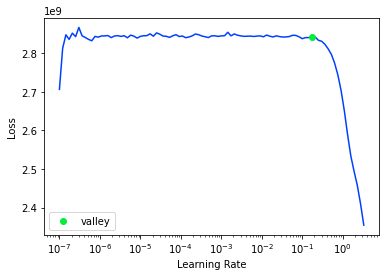

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0   56547   56477.43
1   50056   52439.95
2   47289   47645.52
3   63701   63877.51
4   62377   62899.51
XGBoost RMSE:  500.9045172148571


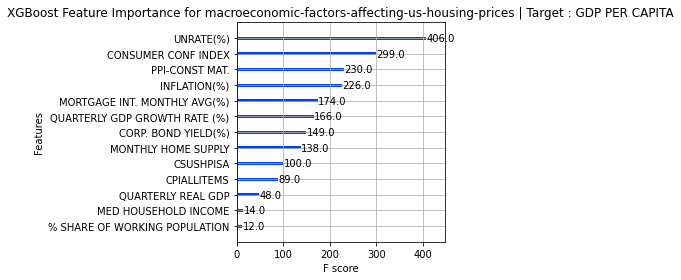

Target Variable: % SHARE OF WORKING POPULATION
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


  7%|▋         | 3/42 [00:00<00:01, 27.54it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9998186539743116, 'Adjusted R-Squared': 0.999749315788019, 'RMSE': 0.12816649762568472, 'Time taken': 0.061919212341308594}
{'Model': 'BaggingRegressor', 'R-Squared': 0.9999864518743387, 'Adjusted R-Squared': 0.9999812717086446, 'RMSE': 0.03503161050867078, 'Time taken': 0.03205084800720215}
{'Model': 'BayesianRidge', 'R-Squared': 0.7807322918279035, 'Adjusted R-Squared': 0.6968946387032784, 'RMSE': 4.456642875996314, 'Time taken': 0.014723777770996094}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.9999792359690863, 'Adjusted R-Squared': 0.9999712967807958, 'RMSE': 0.04336869248925873, 'Time taken': 0.011992216110229492}
{'Model': 'DummyRegressor', 'R-Squared': -9.040621145040006e-07, 'Adjusted R-Squared': -0.3823541909093935, 'RMSE': 9.517451, 'Time taken': 0.008669376373291016}
{'Model': 'ElasticNet', 'R-Squared': 0.38572946909161776, 'Adjusted R-Squared': 0.15086132492076576, 'RMSE': 7.459338850099283, 'Time taken': 0.009521722793579

 17%|█▋        | 7/42 [00:00<00:01, 30.48it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.06382207791538141, 'Adjusted R-Squared': -0.29412830405814927, 'RMSE': 9.208729010878764, 'Time taken': 0.0923624038696289}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 1.0, 'Adjusted R-Squared': 1.0, 'RMSE': 0.0, 'Time taken': 0.01101374626159668}


 26%|██▌       | 11/42 [00:00<00:01, 26.64it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9999984050642267, 'Adjusted R-Squared': 0.9999977952358428, 'RMSE': 0.012019657567765196, 'Time taken': 0.12215352058410645}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': -0.3056389975644733, 'Adjusted R-Squared': -0.8048539083979485, 'RMSE': 10.87506977786465, 'Time taken': 0.02926039695739746}


 33%|███▎      | 14/42 [00:00<00:01, 15.65it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9999860878174491, 'Adjusted R-Squared': 0.9999807684535327, 'RMSE': 0.035499164308132, 'Time taken': 0.1748499870300293}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.6355541531517723, 'Adjusted R-Squared': 0.496207211709803, 'RMSE': 5.745621306193997, 'Time taken': 0.1252000331878662}
{'Model': 'HuberRegressor', 'R-Squared': 0.06639198987438277, 'Adjusted R-Squared': -0.2905757787030592, 'RMSE': 9.196080834836586, 'Time taken': 0.03985238075256348}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9609791879112425, 'Adjusted R-Squared': 0.9460594656420117, 'RMSE': 1.8800467, 'Time taken': 0.011269569396972656}


 43%|████▎     | 18/42 [00:00<00:01, 18.19it/s]

{'Model': 'KernelRidge', 'R-Squared': -46.56546609094709, 'Adjusted R-Squared': -64.75226194925038, 'RMSE': 65.63966771730381, 'Time taken': 0.026720523834228516}
{'Model': 'Lars', 'R-Squared': 0.5728627151566004, 'Adjusted R-Squared': 0.4095455180105947, 'RMSE': 6.220198395109163, 'Time taken': 0.04948925971984863}
{'Model': 'LarsCV', 'R-Squared': 0.5802556372061096, 'Adjusted R-Squared': 0.4197651455496222, 'RMSE': 6.1661336199733405, 'Time taken': 0.07622003555297852}
{'Model': 'Lasso', 'R-Squared': 0.3936456177284571, 'Adjusted R-Squared': 0.16180423627169072, 'RMSE': 7.411118472572183, 'Time taken': 0.010713338851928711}


 50%|█████     | 21/42 [00:01<00:01, 17.00it/s]

{'Model': 'LassoCV', 'R-Squared': -9.446782445188262e-07, 'Adjusted R-Squared': -0.38235424705522036, 'RMSE': 9.517452119995994, 'Time taken': 0.1813046932220459}
{'Model': 'LassoLars', 'R-Squared': -9.446782445188262e-07, 'Adjusted R-Squared': -0.38235424705522036, 'RMSE': 9.517452119995994, 'Time taken': 0.010427236557006836}
{'Model': 'LassoLarsCV', 'R-Squared': -9.446782445188262e-07, 'Adjusted R-Squared': -0.38235424705522036, 'RMSE': 9.517452119995994, 'Time taken': 0.032677650451660156}
{'Model': 'LassoLarsIC', 'R-Squared': 0.8098600285514965, 'Adjusted R-Squared': 0.7371594512329511, 'RMSE': 4.150087063104413, 'Time taken': 0.014249086380004883}
{'Model': 'LinearRegression', 'R-Squared': 0.8072447691342122, 'Adjusted R-Squared': 0.7335442396855286, 'RMSE': 4.178530550458597, 'Time taken': 0.009429216384887695}
{'Model': 'LinearSVR', 'R-Squared': 0.05729010673619139, 'Adjusted R-Squared': -0.30315779362938255, 'RMSE': 9.240799086843822, 'Time taken': 0.012718677520751953}


 71%|███████▏  | 30/42 [00:01<00:00, 17.29it/s]

{'Model': 'MLPRegressor', 'R-Squared': -19.596225170542574, 'Adjusted R-Squared': -27.47125244163238, 'RMSE': 43.19309366559063, 'Time taken': 0.39383864402770996}
{'Model': 'NuSVR', 'R-Squared': 0.07172538154346819, 'Adjusted R-Squared': -0.2832031490428528, 'RMSE': 9.169776139788445, 'Time taken': 0.03347945213317871}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.29013372609859855, 'Adjusted R-Squared': 0.01871426843041568, 'RMSE': 8.018788651718157, 'Time taken': 0.0190887451171875}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.29013372609859855, 'Adjusted R-Squared': 0.01871426843041568, 'RMSE': 8.018788651718157, 'Time taken': 0.02953815460205078}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.24232648395070633, 'Adjusted R-Squared': -0.04737221336225894, 'RMSE': 8.28440932907362, 'Time taken': 0.019249916076660156}
{'Model': 'PoissonRegressor', 'R-Squared': 0.49201146638083193, 'Adjusted R-Squared': 0.2977805564676206, 'RMSE': 6.783400362033788, 'Time ta

 79%|███████▊  | 33/42 [00:02<00:01,  7.76it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.027171110610577864, 'Adjusted R-Squared': -0.4199130058440341, 'RMSE': 9.645880864138904, 'Time taken': 0.9271025657653809}
{'Model': 'RANSACRegressor', 'R-Squared': 0.04614131548821421, 'Adjusted R-Squared': -0.31856935800158626, 'RMSE': 9.295280815876653, 'Time taken': 0.05492568016052246}


 83%|████████▎ | 35/42 [00:02<00:00,  7.88it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.99960068811673, 'Adjusted R-Squared': 0.999448010043715, 'RMSE': 0.19018515414170578, 'Time taken': 0.22253060340881348}
{'Model': 'Ridge', 'R-Squared': 0.6819489181539833, 'Adjusted R-Squared': 0.5603411515658004, 'RMSE': 5.367461452018345, 'Time taken': 0.010539054870605469}
{'Model': 'RidgeCV', 'R-Squared': 0.7814937507111426, 'Adjusted R-Squared': 0.6979472436301088, 'RMSE': 4.448897773699481, 'Time taken': 0.010767936706542969}
{'Model': 'SGDRegressor', 'R-Squared': 0.5395384519955713, 'Adjusted R-Squared': 0.36347962481740737, 'RMSE': 6.458284611625532, 'Time taken': 0.01024317741394043}
{'Model': 'SVR', 'R-Squared': 0.07556727789539752, 'Adjusted R-Squared': -0.27789229232106805, 'RMSE': 9.15078076074317, 'Time taken': 0.010668277740478516}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.8072447691342122, 'Adjusted R-Squared': 0.7335442396855286, 'RMSE': 4.178530550458597, 'Time taken': 0.009644031524658203}
{'Model': 'Twe

100%|██████████| 42/42 [00:03<00:00, 12.32it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9999298328342998, 'Adjusted R-Squared': 0.9999030042121203, 'RMSE': 0.0797237, 'Time taken': 0.37879204750061035}
{'Model': 'LGBMRegressor', 'R-Squared': 0.6322585405016463, 'Adjusted R-Squared': 0.49165151186992284, 'RMSE': 5.771541107082566, 'Time taken': 0.04637289047241211}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: % SHARE OF WORKING POPULATION
% SHARE OF WORKING POPULATION
Target Standard Deviation: 9.49436092376709
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreeRegressor                           1.00       1.00  0.00        0.01
ExtraTreesRegressor                          1.00       1.00  0.01        0.12
BaggingRegressor                             1.00       1.00  0.04        0.03
GradientBoostingRegressor                    1.00       1.00  0.

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,4056.671143,3383.192383,58.165215,00:00
1,3757.494629,1299.078247,36.042728,00:00
2,3266.947510,5701.498047,75.508263,00:00


Better model found at epoch 0 with _rmse value: 58.16521453857422.
Better model found at epoch 1 with _rmse value: 36.042728424072266.
No improvement since epoch 1: early stopping


,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,% SHARE OF WORKING POPULATION,% SHARE OF WORKING POPULATION_pred
0,-1.25,1.67,0.75,1.13,-0.31,-0.57,1.25,-0.76,0.24,1.31,1.43,0.18,-0.17,65.08,34.07
1,1.13,-0.81,-0.03,0.11,0.20,-0.68,0.06,-0.45,-0.60,-0.21,-0.23,0.20,-0.95,66.78,34.90
2,0.77,-1.22,0.07,0.24,-0.50,-1.03,0.23,-0.51,-0.96,-0.05,-0.07,0.23,-1.01,66.55,31.20
3,-0.78,0.66,-0.58,-0.77,0.16,1.34,0.00,0.94,0.71,-0.59,-0.58,0.07,0.43,67.30,14.80
4,0.25,-2.06,-0.13,-0.39,0.80,1.36,0.01,1.70,2.90,-0.59,-0.71,-1.91,0.04,67.22,32.01
5,1.75,-1.48,-0.25,-0.33,-0.75,0.03,-0.06,0.38,1.18,-0.53,-0.56,0.30,-0.34,67.13,20.48
6,-0.16,0.10,-1.54,-1.75,-0.17,1.28,-0.52,1.74,-1.06,-1.68,-1.78,-0.28,2.97,66.59,62.61
7,2.01,-1.29,-0.26,-0.33,-0.04,0.36,-0.06,0.77,0.08,-0.53,-0.56,0.30,-0.32,67.13,23.41
8,-0.37,0.45,-0.96,-1.38,0.39,0.91,-0.26,0.84,-0.86,-1.11,-1.06,0.40,1.01,67.12,40.87


<Figure size 432x288 with 0 Axes>

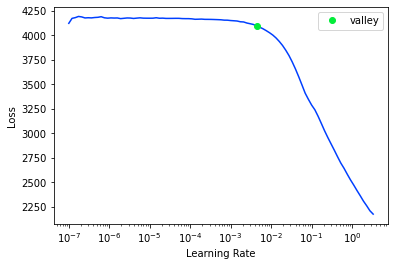

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0   66.78      66.78
1   66.92      66.92
2   64.92      64.93
3   66.11      66.11
4   66.55      66.55
XGBoost RMSE:  0.0797237


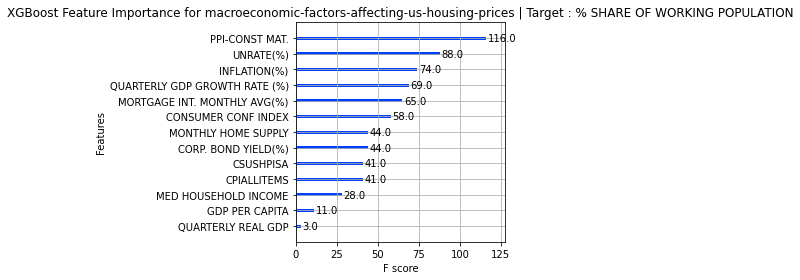

Target Variable: MONTHLY HOME SUPPLY
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


  5%|▍         | 2/42 [00:00<00:02, 14.80it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9208159402719669, 'Adjusted R-Squared': 0.8905396821406601, 'RMSE': 0.5382588388192844, 'Time taken': 0.09959197044372559}
{'Model': 'BaggingRegressor', 'R-Squared': 0.9484332376185856, 'Adjusted R-Squared': 0.9287165343551036, 'RMSE': 0.4343673974019482, 'Time taken': 0.03509783744812012}
{'Model': 'BayesianRidge', 'R-Squared': 0.7964312635360631, 'Adjusted R-Squared': 0.7185961584174989, 'RMSE': 0.8630338473183494, 'Time taken': 0.013113021850585938}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.8316866130894123, 'Adjusted R-Squared': 0.7673314945647758, 'RMSE': 0.7847505301224595, 'Time taken': 0.01363992691040039}
{'Model': 'DummyRegressor', 'R-Squared': -9.98848912825423e-05, 'Adjusted R-Squared': -0.382491017349714, 'RMSE': 1.9129075, 'Time taken': 0.011066675186157227}
{'Model': 'ElasticNet', 'R-Squared': 0.04786670050222863, 'Adjusted R-Squared': -0.31618426695280166, 'RMSE': 1.866470650712382, 'Time taken': 0.010874032974243164

 17%|█▋        | 7/42 [00:00<00:01, 23.33it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.7849709882813086, 'Adjusted R-Squared': 0.7027540132123973, 'RMSE': 0.8869942767175717, 'Time taken': 0.12926793098449707}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.9078148242363313, 'Adjusted R-Squared': 0.8725675511502227, 'RMSE': 0.5807682048751717, 'Time taken': 0.011507987976074219}


 24%|██▍       | 10/42 [00:00<00:01, 20.53it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9256380181874811, 'Adjusted R-Squared': 0.8972054957297534, 'RMSE': 0.5216122304599558, 'Time taken': 0.1478428840637207}
{'Model': 'GammaRegressor', 'R-Squared': 0.33410547358801834, 'Adjusted R-Squared': 0.07949874290108416, 'RMSE': 1.5608997485685114, 'Time taken': 0.011648893356323242}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.8629853896088548, 'Adjusted R-Squared': 0.8105974503416523, 'RMSE': 0.708036633031908, 'Time taken': 0.017029762268066406}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9314197447917049, 'Adjusted R-Squared': 0.9051978825061803, 'RMSE': 0.5009239962247631, 'Time taken': 0.14634966850280762}


 31%|███       | 13/42 [00:00<00:01, 14.72it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9175409969603481, 'Adjusted R-Squared': 0.8860125546216576, 'RMSE': 0.5492768911047803, 'Time taken': 0.1396796703338623}
{'Model': 'HuberRegressor', 'R-Squared': 0.7988824816989465, 'Adjusted R-Squared': 0.721984607054426, 'RMSE': 0.857822115966607, 'Time taken': 0.04452204704284668}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9107711327758091, 'Adjusted R-Squared': 0.876654212954795, 'RMSE': 0.57137996, 'Time taken': 0.011686563491821289}


 38%|███▊      | 16/42 [00:00<00:01, 17.15it/s]

{'Model': 'KernelRidge', 'R-Squared': -8.923857227444934, 'Adjusted R-Squared': -12.71827322617388, 'RMSE': 6.02576987522841, 'Time taken': 0.06160283088684082}
{'Model': 'Lars', 'R-Squared': 0.7988013873433362, 'Adjusted R-Squared': 0.7218725060334352, 'RMSE': 0.8579950435198421, 'Time taken': 0.05658459663391113}


 43%|████▎     | 18/42 [00:01<00:01, 16.89it/s]

{'Model': 'LarsCV', 'R-Squared': 0.5769627244467136, 'Adjusted R-Squared': 0.4152131779116335, 'RMSE': 1.2441180941458256, 'Time taken': 0.06132006645202637}
{'Model': 'Lasso', 'R-Squared': -9.988417509609882e-05, 'Adjusted R-Squared': -0.38249101635969174, 'RMSE': 1.9129075295435631, 'Time taken': 0.0113525390625}


 48%|████▊     | 20/42 [00:01<00:01, 15.27it/s]

{'Model': 'LassoCV', 'R-Squared': 0.7880249144398854, 'Adjusted R-Squared': 0.7069756170198416, 'RMSE': 0.8806730323743459, 'Time taken': 0.15387201309204102}
{'Model': 'LassoLars', 'R-Squared': -9.988417509609882e-05, 'Adjusted R-Squared': -0.38249101635969174, 'RMSE': 1.9129075295435631, 'Time taken': 0.0109710693359375}
{'Model': 'LassoLarsCV', 'R-Squared': 0.7820138872202094, 'Adjusted R-Squared': 0.6986662558632306, 'RMSE': 0.8930724693012371, 'Time taken': 0.029162883758544922}
{'Model': 'LassoLarsIC', 'R-Squared': 0.8015317228749989, 'Adjusted R-Squared': 0.7256467933860278, 'RMSE': 0.8521535115297276, 'Time taken': 0.013139724731445312}
{'Model': 'LinearRegression', 'R-Squared': 0.7937798271707253, 'Adjusted R-Squared': 0.714930937559532, 'RMSE': 0.8686360739192642, 'Time taken': 0.009394168853759766}
{'Model': 'LinearSVR', 'R-Squared': 0.7798785047251252, 'Adjusted R-Squared': 0.6957144035906142, 'RMSE': 0.8974360585265237, 'Time taken': 0.012111902236938477}


 71%|███████▏  | 30/42 [00:01<00:00, 17.46it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.6545971518323812, 'Adjusted R-Squared': 0.5225313569447623, 'RMSE': 1.124178422907491, 'Time taken': 0.40398073196411133}
{'Model': 'NuSVR', 'R-Squared': 0.8630424163594163, 'Adjusted R-Squared': 0.8106762814380166, 'RMSE': 0.7078892719930272, 'Time taken': 0.027442216873168945}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.16305032345589976, 'Adjusted R-Squared': -0.1569598469874327, 'RMSE': 1.7499351757425676, 'Time taken': 0.019314050674438477}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.6830440601986124, 'Adjusted R-Squared': 0.5618550243921996, 'RMSE': 1.0768909707176713, 'Time taken': 0.032587528228759766}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.12806262492144949, 'Adjusted R-Squared': -0.2053251949615258, 'RMSE': 1.7861376910881686, 'Time taken': 0.02039480209350586}
{'Model': 'PoissonRegressor', 'R-Squared': 0.6693114005851604, 'Adjusted R-Squared': 0.5428716419853687, 'RMSE': 1.0999726819702609, 'Time 

 79%|███████▊  | 33/42 [00:03<00:01,  6.51it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.06551016343777771, 'Adjusted R-Squared': -0.47291110828163396, 'RMSE': 1.974472486732856, 'Time taken': 1.0853617191314697}
{'Model': 'RANSACRegressor', 'R-Squared': -377.67915329266896, 'Adjusted R-Squared': -522.4682413163365, 'RMSE': 37.22270983415913, 'Time taken': 0.16002345085144043}


 83%|████████▎ | 35/42 [00:03<00:01,  6.77it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9379997095035645, 'Adjusted R-Squared': 0.9142937160784568, 'RMSE': 0.4762874633215659, 'Time taken': 0.2367229461669922}
{'Model': 'Ridge', 'R-Squared': 0.7947058987984013, 'Adjusted R-Squared': 0.71621109539779, 'RMSE': 0.8666834900732061, 'Time taken': 0.010267496109008789}
{'Model': 'RidgeCV', 'R-Squared': 0.7958108221964347, 'Adjusted R-Squared': 0.7177384895068363, 'RMSE': 0.8643480336420327, 'Time taken': 0.010828971862792969}
{'Model': 'SGDRegressor', 'R-Squared': 0.7763452121978252, 'Adjusted R-Squared': 0.6908301462734642, 'RMSE': 0.9046100074854757, 'Time taken': 0.011338949203491211}
{'Model': 'SVR', 'R-Squared': 0.8537429737254709, 'Adjusted R-Squared': 0.7978211695616804, 'RMSE': 0.7315275010615371, 'Time taken': 0.012928247451782227}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.7937798271707253, 'Adjusted R-Squared': 0.714930937559532, 'RMSE': 0.8686360739192642, 'Time taken': 0.010260581970214844}
{'Model': 'Tw

100%|██████████| 42/42 [00:03<00:00, 10.91it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9076676019035471, 'Adjusted R-Squared': 0.8723640379254916, 'RMSE': 0.5812318, 'Time taken': 0.4352138042449951}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9287511782611927, 'Adjusted R-Squared': 0.9015089817140016, 'RMSE': 0.5105768639403923, 'Time taken': 0.05189156532287598}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: MONTHLY HOME SUPPLY
MONTHLY HOME SUPPLY
Target Standard Deviation: 1.8865513801574707
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
BaggingRegressor                             0.93       0.95  0.43        0.04
RandomForestRegressor                        0.91       0.94  0.48        0.24
GradientBoostingRegressor                    0.91       0.93  0.50        0.15
LGBMRegressor                                0.90       0.93  0.51        0.05
Extr

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,37.905502,106.379845,10.314060,00:00
1,25.025827,295.618042,17.193546,00:00


Better model found at epoch 0 with _rmse value: 10.31406021118164.
No improvement since epoch 0: early stopping


,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,MONTHLY HOME SUPPLY,MONTHLY HOME SUPPLY_pred
0,-0.60,0.26,0.19,0.54,-0.77,-1.01,0.60,-0.90,0.09,0.50,0.63,-0.12,-0.18,5.30,3.02
1,-0.65,0.24,0.21,0.53,-0.88,-1.12,0.60,-1.10,0.09,0.55,0.69,0.07,-0.13,4.50,1.51
2,0.04,0.00,1.45,1.39,-0.35,-1.69,-3.26,-1.64,-0.01,1.52,1.47,0.66,-1.09,4.80,9.12
3,-0.25,-0.11,-1.18,-1.48,0.03,1.02,-0.36,1.16,0.20,-1.32,-1.31,0.18,1.18,4.00,-0.03
4,-0.65,0.61,-0.74,-1.08,0.84,1.40,-0.11,0.81,0.24,-0.83,-0.77,0.54,0.79,6.10,9.96
5,-0.84,1.24,0.38,0.72,-0.19,-0.73,0.74,-0.78,0.06,0.77,0.92,0.14,0.27,6.10,4.86
6,1.66,-1.64,-0.50,-0.42,-2.27,0.65,-0.00,1.05,0.23,-0.70,-0.82,-0.42,-0.12,8.50,7.03
7,0.68,-0.59,0.06,0.24,-0.54,-1.04,0.25,-0.54,0.16,-0.03,-0.05,-0.22,-0.95,4.60,2.15
8,-1.14,0.75,3.43,2.18,3.48,-0.84,-3.26,-1.13,-6.85,2.31,1.86,-0.56,-1.39,6.00,31.86


<Figure size 432x288 with 0 Axes>

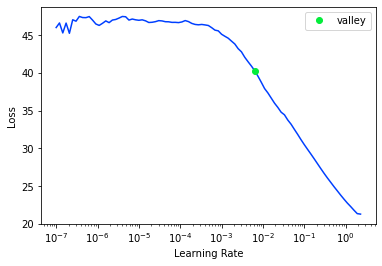

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    6.50       5.86
1    9.70       9.82
2    3.40       4.10
3    4.30       4.18
4    5.40       5.24
XGBoost RMSE:  0.5765461


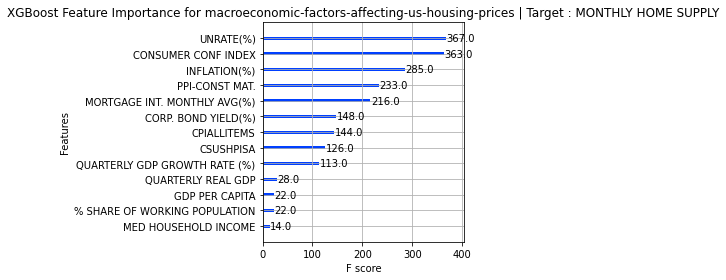

Target Variable: CORP. BOND YIELD(%)
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


  5%|▍         | 2/42 [00:00<00:02, 15.34it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.959066075624599, 'Adjusted R-Squared': 0.9434148692457692, 'RMSE': 0.21148457214088315, 'Time taken': 0.09724855422973633}
{'Model': 'BaggingRegressor', 'R-Squared': 0.9737304334948195, 'Adjusted R-Squared': 0.9636861874781328, 'RMSE': 0.16941952221003698, 'Time taken': 0.03297829627990723}
{'Model': 'BayesianRidge', 'R-Squared': 0.9661994937072128, 'Adjusted R-Squared': 0.9532757707129118, 'RMSE': 0.19217575780848709, 'Time taken': 0.011775493621826172}


 17%|█▋        | 7/42 [00:00<00:01, 29.65it/s]

{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.9545249464629343, 'Adjusted R-Squared': 0.9371374259928797, 'RMSE': 0.22290694974662625, 'Time taken': 0.011597394943237305}
{'Model': 'DummyRegressor', 'R-Squared': -0.015080041577831382, 'Adjusted R-Squared': -0.4031988810046492, 'RMSE': 1.0531424, 'Time taken': 0.008871078491210938}
{'Model': 'ElasticNet', 'R-Squared': 0.6134345711076379, 'Adjusted R-Squared': 0.4656301424134994, 'RMSE': 0.6499029457342655, 'Time taken': 0.009348630905151367}
{'Model': 'ElasticNetCV', 'R-Squared': 0.9668231146293301, 'Adjusted R-Squared': 0.9541378349287799, 'RMSE': 0.19039467845226388, 'Time taken': 0.08183979988098145}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.9789422993189417, 'Adjusted R-Squared': 0.9708908255291253, 'RMSE': 0.15168494332769603, 'Time taken': 0.011548519134521484}


 24%|██▍       | 10/42 [00:00<00:01, 23.00it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9920004514318467, 'Adjusted R-Squared': 0.9889418005087293, 'RMSE': 0.0934909858269541, 'Time taken': 0.1493680477142334}
{'Model': 'GammaRegressor', 'R-Squared': 0.9024559255637408, 'Adjusted R-Squared': 0.8651596618087005, 'RMSE': 0.32646561476231156, 'Time taken': 0.011818885803222656}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.8443859672899021, 'Adjusted R-Squared': 0.7848864841948647, 'RMSE': 0.4123456128838493, 'Time taken': 0.02598857879638672}


 31%|███       | 13/42 [00:00<00:01, 14.86it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.979727811892263, 'Adjusted R-Squared': 0.9719766811451871, 'RMSE': 0.14882891417116542, 'Time taken': 0.18079519271850586}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9784767192167036, 'Adjusted R-Squared': 0.9702472295054433, 'RMSE': 0.15335263234897326, 'Time taken': 0.11831784248352051}
{'Model': 'HuberRegressor', 'R-Squared': 0.9381862912370716, 'Adjusted R-Squared': 0.9145516378865403, 'RMSE': 0.25988391487921286, 'Time taken': 0.04049181938171387}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9602844454140399, 'Adjusted R-Squared': 0.9450990863076434, 'RMSE': 0.20831345, 'Time taken': 0.010378837585449219}
{'Model': 'KernelRidge', 'R-Squared': -17.166207855219387, 'Adjusted R-Squared': -24.11211085868562, 'RMSE': 4.455219841475516, 'Time taken': 0.028588533401489258}


 48%|████▊     | 20/42 [00:01<00:01, 18.23it/s]

{'Model': 'Lars', 'R-Squared': -11.678894441970016, 'Adjusted R-Squared': -16.526707022723258, 'RMSE': 3.7220113452652983, 'Time taken': 0.0511324405670166}
{'Model': 'LarsCV', 'R-Squared': 0.9516532044541633, 'Adjusted R-Squared': 0.9331676649807552, 'RMSE': 0.2298374774985409, 'Time taken': 0.06851506233215332}
{'Model': 'Lasso', 'R-Squared': 0.01086712590753569, 'Adjusted R-Squared': -0.3673307377160535, 'RMSE': 1.0395953242427933, 'Time taken': 0.009728431701660156}
{'Model': 'LassoCV', 'R-Squared': 0.9655753605720951, 'Adjusted R-Squared': 0.9524129984378962, 'RMSE': 0.1939419239257314, 'Time taken': 0.09325981140136719}
{'Model': 'LassoLars', 'R-Squared': -0.01508001989973251, 'Adjusted R-Squared': -0.40319885103786546, 'RMSE': 1.0531425000699817, 'Time taken': 0.011787176132202148}
{'Model': 'LassoLarsCV', 'R-Squared': 0.9648503507023257, 'Adjusted R-Squared': 0.9514107789120385, 'RMSE': 0.1959735670754617, 'Time taken': 0.03246450424194336}
{'Model': 'LassoLarsIC', 'R-Squared':

 71%|███████▏  | 30/42 [00:01<00:00, 18.34it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.7407658668218264, 'Adjusted R-Squared': 0.6416469335478189, 'RMSE': 0.5322100749119235, 'Time taken': 0.40413808822631836}
{'Model': 'NuSVR', 'R-Squared': 0.9741399273260465, 'Adjusted R-Squared': 0.9642522524801231, 'RMSE': 0.1680938676932884, 'Time taken': 0.02985525131225586}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.8863263434122216, 'Adjusted R-Squared': 0.8428628864816005, 'RMSE': 0.3524251673965226, 'Time taken': 0.019783973693847656}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.959584981329127, 'Adjusted R-Squared': 0.9441321800726167, 'RMSE': 0.21013983717253795, 'Time taken': 0.03166532516479492}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.8507356957274325, 'Adjusted R-Squared': 0.7936640499761567, 'RMSE': 0.4038452508685229, 'Time taken': 0.020400047302246094}
{'Model': 'PoissonRegressor', 'R-Squared': 0.9422031186814347, 'Adjusted R-Squared': 0.9201043111184538, 'RMSE': 0.25129809821263505, 'Time tak

 79%|███████▊  | 33/42 [00:03<00:01,  5.52it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.10207305203693284, 'Adjusted R-Squared': -0.5234539248745835, 'RMSE': 1.0973424781766765, 'Time taken': 1.5973186492919922}
{'Model': 'RANSACRegressor', 'R-Squared': -10.204290451132342, 'Adjusted R-Squared': -14.488283858918237, 'RMSE': 3.4988810549836358, 'Time taken': 0.07924342155456543}


 83%|████████▎ | 35/42 [00:03<00:01,  5.87it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9826184327689209, 'Adjusted R-Squared': 0.9759725394158613, 'RMSE': 0.13781023262689698, 'Time taken': 0.23233509063720703}
{'Model': 'Ridge', 'R-Squared': 0.9671918566547726, 'Adjusted R-Squared': 0.9546475665521856, 'RMSE': 0.18933365830926044, 'Time taken': 0.009756088256835938}
{'Model': 'RidgeCV', 'R-Squared': 0.966363481179806, 'Adjusted R-Squared': 0.9535024592779671, 'RMSE': 0.1917090083816541, 'Time taken': 0.011911153793334961}
{'Model': 'SGDRegressor', 'R-Squared': 0.9597292753170534, 'Adjusted R-Squared': 0.9443316452912209, 'RMSE': 0.20976436996779335, 'Time taken': 0.009519338607788086}
{'Model': 'SVR', 'R-Squared': 0.9743028046287214, 'Adjusted R-Squared': 0.9644774063985266, 'RMSE': 0.1675636695972932, 'Time taken': 0.01156759262084961}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.9648503507023194, 'Adjusted R-Squared': 0.9514107789120297, 'RMSE': 0.1959735670754795, 'Time taken': 0.009666919708251953}
{'Model'

100%|██████████| 42/42 [00:04<00:00, 10.23it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9735749640370033, 'Adjusted R-Squared': 0.9634712738158575, 'RMSE': 0.16992012, 'Time taken': 0.4009692668914795}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9818990677184009, 'Adjusted R-Squared': 0.9749781230224953, 'RMSE': 0.14063307449392723, 'Time taken': 0.04533743858337402}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: CORP. BOND YIELD(%)
CORP. BOND YIELD(%)
Target Standard Deviation: 1.0829343795776367
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          0.99       0.99  0.09        0.15
RandomForestRegressor                        0.98       0.98  0.14        0.23
LGBMRegressor                                0.97       0.98  0.14        0.05
GradientBoostingRegressor                    0.97       0.98  0.15        0.18
Ex

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,50.691681,149.942780,12.245112,00:00
1,32.700954,610.689331,24.712130,00:00


Better model found at epoch 0 with _rmse value: 12.245112419128418.
No improvement since epoch 0: early stopping


,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,CORP. BOND YIELD(%),CORP. BOND YIELD(%)_pred
0,-0.22,-0.12,-1.17,-1.47,0.01,1.04,-0.33,-1.04,0.20,-1.32,-1.31,0.17,1.13,5.73,-5.44
1,1.77,-1.75,-0.49,-0.44,-2.69,0.49,0.02,1.08,0.23,-0.69,-0.79,-0.11,-0.16,5.41,-1.53
2,-0.47,-1.06,-0.48,-0.51,1.05,1.16,0.05,2.49,0.23,-0.52,-0.51,-0.65,0.14,5.51,4.79
3,-1.19,1.71,0.69,1.12,-0.28,-0.82,1.23,-0.06,0.01,1.34,1.47,0.11,-0.26,3.29,-11.41
4,-0.07,1.38,2.67,1.69,1.92,-1.53,-3.17,-0.06,-0.01,1.73,1.62,0.77,-1.20,2.79,-31.79
5,1.52,-1.83,-0.12,-0.01,0.92,-0.36,0.03,0.32,0.22,-0.34,-0.41,-0.39,-0.74,4.37,3.50
6,-0.47,0.10,0.13,0.47,-0.71,-0.96,0.61,-0.50,0.09,0.48,0.61,-0.16,-0.28,3.62,3.35
7,-0.58,0.02,0.09,0.39,-0.77,-0.91,0.61,-0.23,0.09,0.43,0.57,0.04,-0.37,3.96,0.12
8,3.66,-0.20,0.64,1.11,-1.33,-1.30,1.15,-0.33,0.01,0.63,0.40,-6.55,-0.73,2.50,4.31


<Figure size 432x288 with 0 Axes>

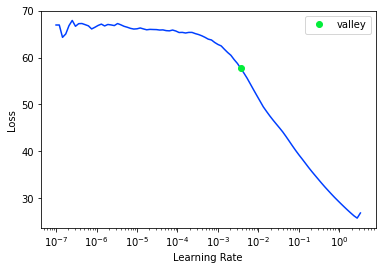

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    2.94       2.87
1    4.38       4.25
2    2.79       2.78
3    3.96       3.75
4    3.93       3.93
XGBoost RMSE:  0.16988523


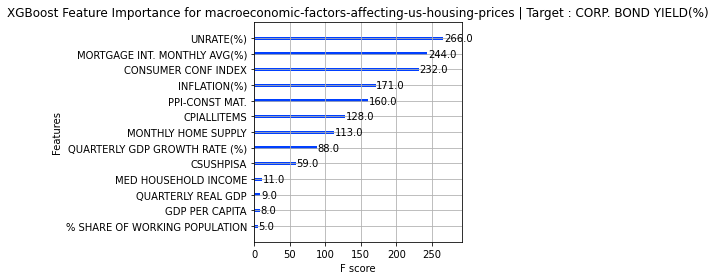

Target Variable: MED HOUSEHOLD INCOME
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


 14%|█▍        | 6/42 [00:00<00:00, 59.90it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9843423971722246, 'Adjusted R-Squared': 0.9783556666792517, 'RMSE': 1802.470479106323, 'Time taken': 0.02822589874267578}
{'Model': 'BaggingRegressor', 'R-Squared': 0.9942631849009107, 'Adjusted R-Squared': 0.9920696967747883, 'RMSE': 1091.0406970907786, 'Time taken': 0.031321048736572266}
{'Model': 'BayesianRidge', 'R-Squared': 0.8515851662330838, 'Adjusted R-Squared': 0.7948383180280865, 'RMSE': 5549.376354047653, 'Time taken': 0.011792898178100586}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.998526724971535, 'Adjusted R-Squared': 0.9979634139312397, 'RMSE': 552.9010799109246, 'Time taken': 0.010237693786621094}
{'Model': 'DummyRegressor', 'R-Squared': -0.0005078336051369536, 'Adjusted R-Squared': -0.38305494645415994, 'RMSE': 14408.4, 'Time taken': 0.008691549301147461}
{'Model': 'ElasticNet', 'R-Squared': 0.4354826723408669, 'Adjusted R-Squared': 0.21963781176531605, 'RMSE': 10822.912885769701, 'Time taken': 0.009534597396850586}


 38%|███▊      | 16/42 [00:00<00:01, 21.31it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9991885061200395, 'Adjusted R-Squared': 0.9988782290482899, 'RMSE': 410.34405776295694, 'Time taken': 0.17730164527893066}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9027328782689122, 'Adjusted R-Squared': 0.865542508195261, 'RMSE': 4492.504870895458, 'Time taken': 0.12447881698608398}
{'Model': 'HuberRegressor', 'R-Squared': 0.7831993095814709, 'Adjusted R-Squared': 0.7003049279508569, 'RMSE': 6707.116574660875, 'Time taken': 0.03807687759399414}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.5667249612776917, 'Adjusted R-Squared': 0.4010609758838679, 'RMSE': 9481.726, 'Time taken': 0.010438203811645508}
{'Model': 'KernelRidge', 'R-Squared': -11.633779134802962, 'Adjusted R-Squared': -16.4643417451688, 'RMSE': 51200.25977095441, 'Time taken': 0.013805627822875977}


 45%|████▌     | 19/42 [00:00<00:01, 21.28it/s]

{'Model': 'Lars', 'R-Squared': 0.4334309460165001, 'Adjusted R-Squared': 0.21680160184633845, 'RMSE': 10842.562871937564, 'Time taken': 0.044225215911865234}
{'Model': 'LarsCV', 'R-Squared': 0.3359933590318007, 'Adjusted R-Squared': 0.08210846689690099, 'RMSE': 11737.935960494737, 'Time taken': 0.08327078819274902}
{'Model': 'Lasso', 'R-Squared': 0.8454894114088192, 'Adjusted R-Squared': 0.7864118334180735, 'RMSE': 5662.192729419266, 'Time taken': 0.012508630752563477}


 52%|█████▏    | 22/42 [00:01<00:01, 18.67it/s]

{'Model': 'LassoCV', 'R-Squared': 0.8546598640069982, 'Adjusted R-Squared': 0.7990886355390858, 'RMSE': 5491.592527769405, 'Time taken': 0.16265535354614258}
{'Model': 'LassoLars', 'R-Squared': 0.8514093923226345, 'Adjusted R-Squared': 0.7945953364459947, 'RMSE': 5552.661561180056, 'Time taken': 0.012405633926391602}
{'Model': 'LassoLarsCV', 'R-Squared': 0.825656501549727, 'Adjusted R-Squared': 0.7589957521422697, 'RMSE': 6014.622887041806, 'Time taken': 0.033576011657714844}
{'Model': 'LassoLarsIC', 'R-Squared': 0.825656501549727, 'Adjusted R-Squared': 0.7589957521422697, 'RMSE': 6014.622887041806, 'Time taken': 0.015048503875732422}
{'Model': 'LinearRegression', 'R-Squared': 0.8256565015496942, 'Adjusted R-Squared': 0.7589957521422243, 'RMSE': 6014.622887042373, 'Time taken': 0.009433507919311523}
{'Model': 'LinearSVR', 'R-Squared': -11.598297922298864, 'Adjusted R-Squared': -16.415294186707253, 'RMSE': 51128.312788253745, 'Time taken': 0.009321928024291992}


 71%|███████▏  | 30/42 [00:01<00:00, 17.17it/s]

{'Model': 'MLPRegressor', 'R-Squared': -11.680260181582804, 'Adjusted R-Squared': -16.528594956893876, 'RMSE': 51294.35896081453, 'Time taken': 0.392406702041626}
{'Model': 'NuSVR', 'R-Squared': -0.055682963843870725, 'Adjusted R-Squared': -0.45932645001946826, 'RMSE': 14800.360057967468, 'Time taken': 0.02570343017578125}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.46912847024518267, 'Adjusted R-Squared': 0.2661481794565761, 'RMSE': 10495.430131168268, 'Time taken': 0.019318580627441406}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.5482263378900616, 'Adjusted R-Squared': 0.37548934943626167, 'RMSE': 9682.020069402544, 'Time taken': 0.030902862548828125}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.05525513727183484, 'Adjusted R-Squared': -0.30597083965364, 'RMSE': 14001.120514904645, 'Time taken': 0.042386531829833984}
{'Model': 'PoissonRegressor', 'R-Squared': 0.6576622455779102, 'Adjusted R-Squared': 0.5267683982988759, 'RMSE': 8428.162938999089, 'Time

 79%|███████▊  | 33/42 [00:03<00:01,  5.69it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.004599220955680439, 'Adjusted R-Squared': -0.38871068779167595, 'RMSE': 14437.830630819304, 'Time taken': 1.4043405055999756}
{'Model': 'RANSACRegressor', 'R-Squared': -0.41133917161263933, 'Adjusted R-Squared': -0.9509688548762956, 'RMSE': 17112.80580630616, 'Time taken': 0.0795888900756836}


 83%|████████▎ | 35/42 [00:03<00:01,  6.16it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9983901504729418, 'Adjusted R-Squared': 0.9977746197714195, 'RMSE': 577.960511136646, 'Time taken': 0.20285916328430176}
{'Model': 'Ridge', 'R-Squared': 0.8928100832998367, 'Adjusted R-Squared': 0.8518257033850684, 'RMSE': 4716.094415507201, 'Time taken': 0.010014772415161133}
{'Model': 'RidgeCV', 'R-Squared': 0.857821996226652, 'Adjusted R-Squared': 0.803459818313313, 'RMSE': 5431.524345003353, 'Time taken': 0.00983881950378418}
{'Model': 'SGDRegressor', 'R-Squared': 0.8955474657833823, 'Adjusted R-Squared': 0.8556097321123226, 'RMSE': 4655.485892399026, 'Time taken': 0.017383575439453125}
{'Model': 'SVR', 'R-Squared': -0.003480396288386256, 'Adjusted R-Squared': -0.38716407722218094, 'RMSE': 14429.78866704812, 'Time taken': 0.012867212295532227}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.8256565015496942, 'Adjusted R-Squared': 0.7589957521422243, 'RMSE': 6014.622887042373, 'Time taken': 0.010539770126342773}
{'Model': 'Twe

100%|██████████| 42/42 [00:03<00:00, 10.89it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9998359983156764, 'Adjusted R-Squared': 0.9997732917893174, 'RMSE': 184.47166, 'Time taken': 0.41455936431884766}
{'Model': 'LGBMRegressor', 'R-Squared': 0.888576926958915, 'Adjusted R-Squared': 0.8459739872667354, 'RMSE': 4808.316983413779, 'Time taken': 0.048343658447265625}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: MED HOUSEHOLD INCOME
MED HOUSEHOLD INCOME
Target Standard Deviation: 15661.916015625
                               Adjusted R-Squared  R-Squared     RMSE  \
Model                                                                   
ExtraTreeRegressor                           1.00       1.00    75.92   
XGBRegressor                                 1.00       1.00   184.47   
ExtraTreesRegressor                          1.00       1.00   267.21   
GradientBoostingRegressor                    1.00       1.00   410.34   
DecisionTreeRegressor                    

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,2702775808.000000,2633137152.000000,51314.101562,00:00
1,2703020800.000000,2630494464.000000,51288.347656,00:00
2,2703063040.000000,2624474368.000000,51229.625000,00:00
3,2700680960.000000,2606100224.000000,51049.976562,00:00
4,2698490368.000000,2585943808.000000,50852.175781,00:00
5,2694138880.000000,2518697216.000000,50186.625000,00:00
6,2686335488.000000,2368860928.000000,48670.945312,00:00
7,2674486272.000000,2296332544.000000,47920.062500,00:00
8,2656855040.000000,2257834240.000000,47516.671875,00:00
9,2633583872.000000,2191955712.000000,46818.328125,00:00


Better model found at epoch 0 with _rmse value: 51314.1015625.
Better model found at epoch 1 with _rmse value: 51288.34765625.
Better model found at epoch 2 with _rmse value: 51229.625.
Better model found at epoch 3 with _rmse value: 51049.9765625.
Better model found at epoch 4 with _rmse value: 50852.17578125.
Better model found at epoch 5 with _rmse value: 50186.625.
Better model found at epoch 6 with _rmse value: 48670.9453125.
Better model found at epoch 7 with _rmse value: 47920.0625.
Better model found at epoch 8 with _rmse value: 47516.671875.
Better model found at epoch 9 with _rmse value: 46818.328125.
Better model found at epoch 10 with _rmse value: 43285.94921875.
Better model found at epoch 11 with _rmse value: 42461.46484375.
Better model found at epoch 12 with _rmse value: 40972.31640625.
Better model found at epoch 13 with _rmse value: 39037.86328125.
Better model found at epoch 14 with _rmse value: 38694.046875.
No improvement since epoch 14: early stopping


,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,MED HOUSEHOLD INCOME,MED HOUSEHOLD INCOME_pred
0,-0.54,-0.23,-0.86,-1.13,0.72,1.55,0.91,-0.53,0.23,-0.93,-0.90,0.09,0.81,46326.00,8135.61
1,1.09,-0.25,0.82,1.24,-0.57,-1.60,-2.09,-1.51,0.04,1.19,1.16,4.77,-0.86,67521.00,16767.17
2,-0.68,0.45,-0.73,-1.05,0.66,1.54,1.01,-0.01,0.25,-0.84,-0.78,0.62,0.75,48201.00,7919.53
3,-0.25,0.25,-1.34,-1.57,-0.34,0.90,0.99,-1.28,0.21,-1.39,-1.38,0.10,1.27,44334.00,9152.40
4,0.80,-2.07,-0.35,-0.61,-1.33,0.36,0.56,3.62,0.24,-0.68,-0.81,-1.07,-0.03,49777.00,14626.74
5,-0.78,0.66,-0.59,-0.78,0.19,1.41,0.96,0.85,0.25,-0.60,-0.58,0.14,0.41,50233.00,12081.37
6,-1.07,0.95,3.15,1.96,2.86,-1.45,-1.71,-0.19,0.02,2.15,1.88,0.84,-1.32,0.00,1510.33
7,0.80,-0.73,-0.05,0.15,-0.06,-1.18,-0.93,-0.59,0.20,-0.12,-0.16,-0.21,-1.03,51017.00,14219.11
8,-1.21,1.34,0.65,1.15,-0.29,-0.90,-1.37,-0.30,0.04,1.40,1.53,0.03,-0.42,68703.00,16110.89


<Figure size 432x288 with 0 Axes>

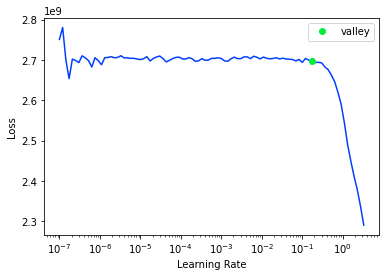

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
    actual  predicted
0 46326.00   46327.66
1 67521.00   67507.20
2 48201.00   48236.26
3 67521.00   67520.13
4 50303.00   50181.02
XGBoost RMSE:  184.4939


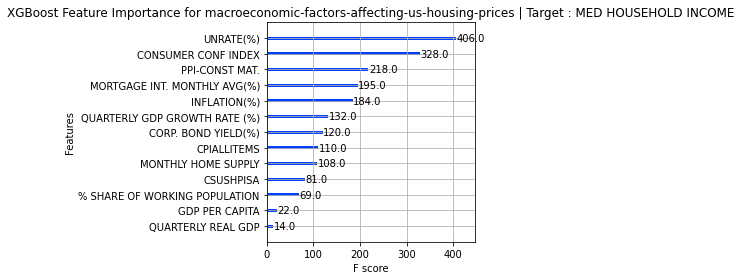

Target Variable: MORTGAGE INT. MONTHLY AVG(%)
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


  5%|▍         | 2/42 [00:00<00:02, 14.88it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.975945670250693, 'Adjusted R-Squared': 0.9667484265230168, 'RMSE': 0.1787662461181848, 'Time taken': 0.09912753105163574}
{'Model': 'BaggingRegressor', 'R-Squared': 0.9861556007674893, 'Adjusted R-Squared': 0.9808621540021176, 'RMSE': 0.1356206894208502, 'Time taken': 0.0351099967956543}
{'Model': 'BayesianRidge', 'R-Squared': 0.9647111220213861, 'Adjusted R-Squared': 0.9512183157354455, 'RMSE': 0.21652488443685503, 'Time taken': 0.013740301132202148}


 17%|█▋        | 7/42 [00:00<00:01, 29.93it/s]

{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.9756581598155494, 'Adjusted R-Squared': 0.9663509856273771, 'RMSE': 0.17983142837607471, 'Time taken': 0.013022899627685547}
{'Model': 'DummyRegressor', 'R-Squared': -0.01732522522823987, 'Adjusted R-Squared': -0.40630251722727273, 'RMSE': 1.162569, 'Time taken': 0.00960993766784668}
{'Model': 'ElasticNet', 'R-Squared': 0.5306767185700881, 'Adjusted R-Squared': 0.35122958155276895, 'RMSE': 0.7896323633299986, 'Time taken': 0.009501218795776367}
{'Model': 'ElasticNetCV', 'R-Squared': 0.9616843277185804, 'Adjusted R-Squared': 0.9470342177286258, 'RMSE': 0.2256197509399697, 'Time taken': 0.07231783866882324}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.9621582576477061, 'Adjusted R-Squared': 0.9476893561600643, 'RMSE': 0.2242200539312444, 'Time taken': 0.01362752914428711}


 26%|██▌       | 11/42 [00:00<00:01, 22.98it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9931542764006545, 'Adjusted R-Squared': 0.9905367938479636, 'RMSE': 0.095367098707888, 'Time taken': 0.15418744087219238}
{'Model': 'GammaRegressor', 'R-Squared': 0.8783820973263724, 'Adjusted R-Squared': 0.8318811345393972, 'RMSE': 0.4019644498024494, 'Time taken': 0.012939691543579102}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.723777509229807, 'Adjusted R-Squared': 0.6181630274647332, 'RMSE': 0.6057848515235913, 'Time taken': 0.03722357749938965}


 33%|███▎      | 14/42 [00:00<00:01, 14.96it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.989882376682149, 'Adjusted R-Squared': 0.986013873648853, 'RMSE': 0.11593862452919651, 'Time taken': 0.17488431930541992}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9861252739549294, 'Adjusted R-Squared': 0.9808202316435789, 'RMSE': 0.1357691499362771, 'Time taken': 0.12305712699890137}
{'Model': 'HuberRegressor', 'R-Squared': 0.9504764093954851, 'Adjusted R-Squared': 0.9315409188702294, 'RMSE': 0.2565044788917483, 'Time taken': 0.03838801383972168}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9720960824713645, 'Adjusted R-Squared': 0.961426937533945, 'RMSE': 0.19254023, 'Time taken': 0.011131525039672852}
{'Model': 'KernelRidge', 'R-Squared': -15.584887395721072, 'Adjusted R-Squared': -21.9261678705556, 'RMSE': 4.694022360259225, 'Time taken': 0.0322575569152832}


 50%|█████     | 21/42 [00:01<00:01, 19.78it/s]

{'Model': 'Lars', 'R-Squared': 0.9193506997124591, 'Adjusted R-Squared': 0.8885142025436934, 'RMSE': 0.3273325489420922, 'Time taken': 0.047702789306640625}
{'Model': 'LarsCV', 'R-Squared': 0.9529051073192167, 'Adjusted R-Squared': 0.934898236588329, 'RMSE': 0.2501357670894344, 'Time taken': 0.07481026649475098}
{'Model': 'Lasso', 'R-Squared': 0.043380696854547374, 'Adjusted R-Squared': -0.32238550728930204, 'RMSE': 1.127349198691479, 'Time taken': 0.010412216186523438}
{'Model': 'LassoCV', 'R-Squared': 0.9611217465438174, 'Adjusted R-Squared': 0.9462565319870417, 'RMSE': 0.2272700794706211, 'Time taken': 0.08048415184020996}
{'Model': 'LassoLars', 'R-Squared': -0.017325297646999305, 'Adjusted R-Squared': -0.4063026173355577, 'RMSE': 1.1625691987911944, 'Time taken': 0.009383440017700195}
{'Model': 'LassoLarsCV', 'R-Squared': 0.9673480418251617, 'Adjusted R-Squared': 0.9548634695818411, 'RMSE': 0.20827805156996937, 'Time taken': 0.03699135780334473}
{'Model': 'LassoLarsIC', 'R-Squared'

 71%|███████▏  | 30/42 [00:01<00:00, 17.92it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.7487705920460445, 'Adjusted R-Squared': 0.6527122890048263, 'RMSE': 0.5777289464358635, 'Time taken': 0.4123373031616211}
{'Model': 'NuSVR', 'R-Squared': 0.9798963737381972, 'Adjusted R-Squared': 0.9722096931086843, 'RMSE': 0.1634278590606573, 'Time taken': 0.028288602828979492}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.8882001940008388, 'Adjusted R-Squared': 0.8454532093541007, 'RMSE': 0.3853979634829429, 'Time taken': 0.019577503204345703}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.948257121786705, 'Adjusted R-Squared': 0.9284730801169156, 'RMSE': 0.26218882777567365, 'Time taken': 0.031200170516967773}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.9035720962278955, 'Adjusted R-Squared': 0.8667026036091496, 'RMSE': 0.35792353279477823, 'Time taken': 0.020378589630126953}
{'Model': 'PoissonRegressor', 'R-Squared': 0.9440202503271399, 'Adjusted R-Squared': 0.9226162283933992, 'RMSE': 0.27271207416648585, 'Time t

 79%|███████▊  | 33/42 [00:03<00:01,  5.86it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.008935984540508368, 'Adjusted R-Squared': -0.3947056256883499, 'RMSE': 1.1577657462553688, 'Time taken': 1.4230828285217285}
{'Model': 'RANSACRegressor', 'R-Squared': -9.505825265163518, 'Adjusted R-Squared': -13.522758454784862, 'RMSE': 3.7359751349514867, 'Time taken': 0.0705573558807373}


 83%|████████▎ | 35/42 [00:03<00:01,  6.16it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9890808886698086, 'Adjusted R-Squared': 0.9849059343376766, 'RMSE': 0.1204432698634354, 'Time taken': 0.23814988136291504}
{'Model': 'Ridge', 'R-Squared': 0.962155723089337, 'Adjusted R-Squared': 0.9476858525058481, 'RMSE': 0.22422756269357091, 'Time taken': 0.011254072189331055}
{'Model': 'RidgeCV', 'R-Squared': 0.9655596939663876, 'Adjusted R-Squared': 0.9523913416594182, 'RMSE': 0.2139057167110583, 'Time taken': 0.010817289352416992}
{'Model': 'SGDRegressor', 'R-Squared': 0.9492310956999923, 'Adjusted R-Squared': 0.9298194558205776, 'RMSE': 0.2597094698577771, 'Time taken': 0.009909868240356445}
{'Model': 'SVR', 'R-Squared': 0.979546253342691, 'Adjusted R-Squared': 0.9717257031501905, 'RMSE': 0.16484482836006406, 'Time taken': 0.012093782424926758}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.9673480418251615, 'Adjusted R-Squared': 0.954863469581841, 'RMSE': 0.2082780515699696, 'Time taken': 0.009939193725585938}
{'Model': 

100%|██████████| 42/42 [00:03<00:00, 10.60it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9843925771160831, 'Adjusted R-Squared': 0.9784250330722325, 'RMSE': 0.14399734, 'Time taken': 0.4026310443878174}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9870157256737544, 'Adjusted R-Squared': 0.9820511501960723, 'RMSE': 0.13134021767120205, 'Time taken': 0.053690195083618164}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: MORTGAGE INT. MONTHLY AVG(%)
MORTGAGE INT. MONTHLY AVG(%)
Target Standard Deviation: 1.106552004814148
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          0.99       0.99  0.10        0.15
GradientBoostingRegressor                    0.99       0.99  0.12        0.17
RandomForestRegressor                        0.98       0.99  0.12        0.24
LGBMRegressor                                0.98       0.99  0

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,23.812811,421.864258,20.539335,00:00
1,17.236881,163.286957,12.778378,00:00
2,13.488293,330.204681,18.171535,00:00


Better model found at epoch 0 with _rmse value: 20.539335250854492.
Better model found at epoch 1 with _rmse value: 12.7783784866333.
No improvement since epoch 1: early stopping


,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,MORTGAGE INT. MONTHLY AVG(%),MORTGAGE INT. MONTHLY AVG(%)_pred
0,1.33,-2.56,-0.41,-0.52,-1.64,-0.02,0.95,2.72,0.22,-0.66,-0.79,-1.27,-0.10,5.00,-0.59
1,1.73,-1.48,-0.31,-0.31,-0.71,-0.05,0.01,1.53,0.22,-0.46,-0.48,0.18,-0.37,4.43,2.31
2,0.34,-0.36,0.17,0.38,-0.49,0.24,-0.10,-0.21,0.13,0.10,0.07,-0.66,-0.86,4.34,5.41
3,1.13,-2.60,-0.38,-0.54,-1.26,-0.02,0.74,2.45,0.22,-0.66,-0.79,-1.27,-0.08,5.13,-1.19
4,0.58,-0.79,0.07,0.28,-0.82,0.24,0.04,-0.59,0.16,0.11,0.10,0.14,-0.94,4.19,6.03
5,-0.06,-0.49,-1.53,-1.66,0.40,-0.46,1.38,-0.80,0.18,-1.62,-1.71,-0.01,2.54,5.84,5.96
6,-0.66,0.54,-0.56,-0.69,0.03,0.01,1.17,1.25,0.24,-0.53,-0.51,0.06,0.34,6.70,14.45
7,2.47,0.26,0.71,1.21,-1.01,1.18,-1.92,-1.13,0.01,0.66,0.42,-7.11,-0.81,3.16,2.06
8,1.08,-0.83,-0.02,0.12,0.20,0.06,-0.46,-0.59,0.18,-0.19,-0.21,0.22,-0.95,3.95,6.49


<Figure size 432x288 with 0 Axes>

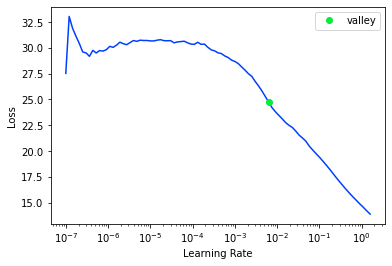

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    6.70       6.46
1    2.90       2.98
2    6.14       5.89
3    5.71       6.02
4    5.05       5.03
XGBoost RMSE:  0.143743


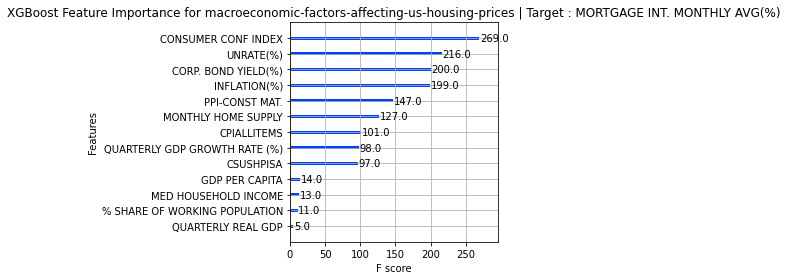

Target Variable: INFLATION(%)
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'CPIALLITEMS', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


  7%|▋         | 3/42 [00:00<00:01, 28.02it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.8426630487710052, 'Adjusted R-Squared': 0.78250480271286, 'RMSE': 0.6869104054931573, 'Time taken': 0.06097149848937988}
{'Model': 'BaggingRegressor', 'R-Squared': 0.8887379129779692, 'Adjusted R-Squared': 0.8461965267636633, 'RMSE': 0.5776414254558547, 'Time taken': 0.03469705581665039}
{'Model': 'BayesianRidge', 'R-Squared': 0.7519855809694729, 'Adjusted R-Squared': 0.6571565383989773, 'RMSE': 0.8624286894385077, 'Time taken': 0.01115107536315918}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.8724558555826581, 'Adjusted R-Squared': 0.823688976834851, 'RMSE': 0.6184648080907605, 'Time taken': 0.012287378311157227}
{'Model': 'DummyRegressor', 'R-Squared': -0.040904284224674736, 'Adjusted R-Squared': -0.438897098781168, 'RMSE': 1.7668111, 'Time taken': 0.009090185165405273}
{'Model': 'ElasticNet', 'R-Squared': 0.2937485786245676, 'Adjusted R-Squared': 0.023711270451608146, 'RMSE': 1.4553397699712243, 'Time taken': 0.009804248809814453}


 17%|█▋        | 7/42 [00:00<00:01, 27.16it/s]

{'Model': 'ElasticNetCV', 'R-Squared': 0.7367435897430685, 'Adjusted R-Squared': 0.6360867269977712, 'RMSE': 0.8885343204884618, 'Time taken': 0.11701416969299316}


 24%|██▍       | 10/42 [00:00<00:01, 22.10it/s]

{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.818387274297515, 'Adjusted R-Squared': 0.7489471144700943, 'RMSE': 0.7380025599011357, 'Time taken': 0.013701915740966797}
{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9206823330482826, 'Adjusted R-Squared': 0.8903549898020378, 'RMSE': 0.4877190236206563, 'Time taken': 0.15033435821533203}
GammaRegressor model failed to execute
Some value(s) of y are out of the valid range for family GammaDistribution
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.9189861183088873, 'Adjusted R-Squared': 0.8880102223681677, 'RMSE': 0.49290639268159586, 'Time taken': 0.03588414192199707}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.8956974279579184, 'Adjusted R-Squared': 0.8558170327653578, 'RMSE': 0.5592837988547621, 'Time taken': 0.1712946891784668}


 31%|███       | 13/42 [00:00<00:02, 14.08it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.727226447174212, 'Adjusted R-Squared': 0.6229306769761167, 'RMSE': 0.9044527012700968, 'Time taken': 0.13541746139526367}
{'Model': 'HuberRegressor', 'R-Squared': 0.7702144161435337, 'Adjusted R-Squared': 0.6823552223160613, 'RMSE': 0.8301300196621204, 'Time taken': 0.036496877670288086}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.7219803153882272, 'Adjusted R-Squared': 0.6156786712719611, 'RMSE': 0.91310877, 'Time taken': 0.010146379470825195}


 40%|████      | 17/42 [00:00<00:01, 17.97it/s]

{'Model': 'KernelRidge', 'R-Squared': -0.9334734860663221, 'Adjusted R-Squared': -1.6727427601505038, 'RMSE': 2.4079853504932243, 'Time taken': 0.03440594673156738}
{'Model': 'Lars', 'R-Squared': 0.7815794491754042, 'Adjusted R-Squared': 0.6980657091542353, 'RMSE': 0.8093408832457468, 'Time taken': 0.04905867576599121}
{'Model': 'LarsCV', 'R-Squared': 0.6726674326974966, 'Adjusted R-Squared': 0.5475108628465395, 'RMSE': 0.9907848070213225, 'Time taken': 0.06649541854858398}
{'Model': 'Lasso', 'R-Squared': -0.04090433097820534, 'Adjusted R-Squared': -0.43889716341104856, 'RMSE': 1.766811176188097, 'Time taken': 0.010942697525024414}


 48%|████▊     | 20/42 [00:01<00:01, 15.37it/s]

{'Model': 'LassoCV', 'R-Squared': 0.7816893312366106, 'Adjusted R-Squared': 0.6982176049447264, 'RMSE': 0.8091372777886716, 'Time taken': 0.1728665828704834}
{'Model': 'LassoLars', 'R-Squared': -0.04090433097820534, 'Adjusted R-Squared': -0.43889716341104856, 'RMSE': 1.766811176188097, 'Time taken': 0.011466741561889648}
{'Model': 'LassoLarsCV', 'R-Squared': 0.6859535821526823, 'Adjusted R-Squared': 0.5658770106228256, 'RMSE': 0.970468966200491, 'Time taken': 0.03227519989013672}
{'Model': 'LassoLarsIC', 'R-Squared': 0.7819596757454517, 'Adjusted R-Squared': 0.6985913164716537, 'RMSE': 0.8086361259576685, 'Time taken': 0.014633893966674805}
{'Model': 'LinearRegression', 'R-Squared': 0.781959675745422, 'Adjusted R-Squared': 0.6985913164716129, 'RMSE': 0.8086361259577234, 'Time taken': 0.009822845458984375}
{'Model': 'LinearSVR', 'R-Squared': 0.7183785096399115, 'Adjusted R-Squared': 0.6106997045022305, 'RMSE': 0.9190044752118779, 'Time taken': 0.012326717376708984}


 71%|███████▏  | 30/42 [00:01<00:00, 17.22it/s]

{'Model': 'MLPRegressor', 'R-Squared': 0.7726972873770176, 'Adjusted R-Squared': 0.6857874266682302, 'RMSE': 0.8256329928182382, 'Time taken': 0.40380239486694336}
{'Model': 'NuSVR', 'R-Squared': 0.6766239910591623, 'Adjusted R-Squared': 0.5529802229347243, 'RMSE': 0.9847786587380235, 'Time taken': 0.028911352157592773}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.38427288843199436, 'Adjusted R-Squared': 0.1488478163618746, 'RMSE': 1.3588729963771362, 'Time taken': 0.020337343215942383}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.6242923596145646, 'Adjusted R-Squared': 0.48063943829072175, 'RMSE': 1.0614749350489452, 'Time taken': 0.031083345413208008}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.01092555397751549, 'Adjusted R-Squared': -0.36724996950166977, 'RMSE': 1.7222620052473983, 'Time taken': 0.019246578216552734}
PoissonRegressor model failed to execute
Some value(s) of y are out of the valid range for family PoissonDistribution


 79%|███████▊  | 33/42 [00:02<00:01,  7.12it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.08553552216480598, 'Adjusted R-Squared': -0.5005932218160554, 'RMSE': 1.8042916935818396, 'Time taken': 1.0090360641479492}
{'Model': 'RANSACRegressor', 'R-Squared': -562.8486714538919, 'Adjusted R-Squared': -778.437869362733, 'RMSE': 41.12122187055674, 'Time taken': 0.14837121963500977}


 83%|████████▎ | 35/42 [00:03<00:00,  7.34it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.8930936310960361, 'Adjusted R-Squared': 0.8522176665151088, 'RMSE': 0.566221713187633, 'Time taken': 0.22441506385803223}
{'Model': 'Ridge', 'R-Squared': 0.7509158946092465, 'Adjusted R-Squared': 0.6556778543127819, 'RMSE': 0.8642865161578303, 'Time taken': 0.010807991027832031}
{'Model': 'RidgeCV', 'R-Squared': 0.7802117202434345, 'Adjusted R-Squared': 0.6961750250423948, 'RMSE': 0.8118709369060703, 'Time taken': 0.01196146011352539}
{'Model': 'SGDRegressor', 'R-Squared': 0.7030018951576267, 'Adjusted R-Squared': 0.5894437962473075, 'RMSE': 0.9437600057272956, 'Time taken': 0.010725736618041992}
{'Model': 'SVR', 'R-Squared': 0.6786959848984951, 'Adjusted R-Squared': 0.5558444497126256, 'RMSE': 0.9816186619148427, 'Time taken': 0.012488126754760742}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.781959675745422, 'Adjusted R-Squared': 0.6985913164716129, 'RMSE': 0.8086361259577234, 'Time taken': 0.010049581527709961}
{'Model': 'T

100%|██████████| 42/42 [00:03<00:00, 11.41it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9030283662192632, 'Adjusted R-Squared': 0.8659509768325109, 'RMSE': 0.539271, 'Time taken': 0.4145674705505371}
{'Model': 'LGBMRegressor', 'R-Squared': 0.7741993198287067, 'Adjusted R-Squared': 0.6878637656455652, 'RMSE': 0.8229005505964191, 'Time taken': 0.04219675064086914}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: INFLATION(%)
INFLATION(%)
Target Standard Deviation: 1.606550931930542
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          0.89       0.92  0.49        0.15
GaussianProcessRegressor                     0.89       0.92  0.49        0.04
XGBRegressor                                 0.87       0.90  0.54        0.41
GradientBoostingRegressor                    0.86       0.90  0.56        0.17
RandomForestRegresso

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,6.604103,52.350933,7.235394,00:00
1,6.624143,131.579529,11.470812,00:00


Better model found at epoch 0 with _rmse value: 7.235394477844238.
No improvement since epoch 0: early stopping


,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,CPIALLITEMS,MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,INFLATION(%),INFLATION(%)_pred
0,0.93,0.42,1.09,1.35,-1.66,1.21,-2.07,-1.38,-0.04,1.28,1.22,5.24,-0.96,1.37,4.36
1,0.07,-0.32,0.21,0.44,-0.36,0.21,-0.25,-0.19,0.11,0.23,0.21,0.60,-0.85,1.95,2.73
2,0.07,0.01,0.25,0.48,-0.55,0.21,-0.33,0.06,0.11,0.32,0.33,0.51,-0.85,1.99,1.25
3,-0.68,0.33,-0.59,-0.67,1.48,-0.03,1.08,1.25,0.23,-0.48,-0.45,0.10,0.28,3.54,-1.08
4,-0.08,1.38,2.90,1.79,-1.59,-3.65,-1.62,-0.14,-0.06,1.84,1.70,0.87,-1.27,5.39,11.41
5,1.49,-1.13,-0.10,0.00,-0.09,-0.05,0.43,0.27,0.21,-0.33,-0.38,0.15,-0.65,3.57,-3.69
6,-0.63,0.07,0.22,0.56,-1.02,0.60,-0.81,-0.50,0.06,0.54,0.66,-0.12,-0.26,1.02,-0.27
7,-0.93,0.71,3.25,2.04,-1.50,-3.65,-1.78,0.06,-0.06,2.26,1.97,0.90,-1.39,6.81,14.96
8,1.94,-1.44,-0.31,-0.32,0.21,-0.10,0.72,0.53,0.21,-0.58,-0.63,0.02,-0.32,2.31,8.96


<Figure size 432x288 with 0 Axes>

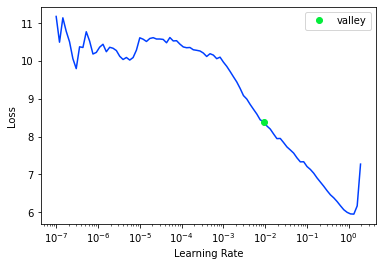

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0    0.12       0.36
1    1.69       1.88
2    2.20       2.38
3    1.02       1.33
4    1.41       1.76
XGBoost RMSE:  0.53931785


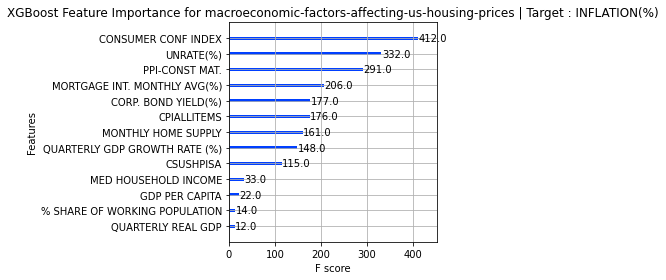

Target Variable: CPIALLITEMS
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'PPI-CONST MAT.', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


  2%|▏         | 1/42 [00:00<00:04,  9.64it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.995934006220096, 'Adjusted R-Squared': 0.9943793615395444, 'RMSE': 0.7710938615120313, 'Time taken': 0.10364556312561035}
{'Model': 'BaggingRegressor', 'R-Squared': 0.9973569187717128, 'Adjusted R-Squared': 0.9963463288903089, 'RMSE': 0.6216975358279035, 'Time taken': 0.03402209281921387}


 17%|█▋        | 7/42 [00:00<00:01, 30.35it/s]

{'Model': 'BayesianRidge', 'R-Squared': 0.9955572895592676, 'Adjusted R-Squared': 0.9938586061554582, 'RMSE': 0.8060238545729997, 'Time taken': 0.011543750762939453}
{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.997994421489774, 'Adjusted R-Squared': 0.9972275826476288, 'RMSE': 0.5415564399256116, 'Time taken': 0.014224052429199219}
{'Model': 'DummyRegressor', 'R-Squared': -0.04546723278143783, 'Adjusted R-Squared': -0.44520470413904634, 'RMSE': 12.364573, 'Time taken': 0.009517669677734375}
{'Model': 'ElasticNet', 'R-Squared': 0.9629685395505817, 'Adjusted R-Squared': 0.9488094517316865, 'RMSE': 2.3270692688205643, 'Time taken': 0.009809017181396484}
{'Model': 'ElasticNetCV', 'R-Squared': 0.9947491296184516, 'Adjusted R-Squared': 0.9927414438843302, 'RMSE': 0.8762732209058121, 'Time taken': 0.06751155853271484}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.9985446375892422, 'Adjusted R-Squared': 0.9979881754910113, 'RMSE': 0.46132763151006756, 'Time taken': 0.012252092361450195}


 24%|██▍       | 10/42 [00:00<00:01, 22.99it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9992044250844245, 'Adjusted R-Squared': 0.998900234675528, 'RMSE': 0.34108642219189456, 'Time taken': 0.15384936332702637}
{'Model': 'GammaRegressor', 'R-Squared': 0.9567992354474678, 'Adjusted R-Squared': 0.9402812960597349, 'RMSE': 2.5134462790557177, 'Time taken': 0.012408733367919922}
{'Model': 'GaussianProcessRegressor', 'R-Squared': -1.7331368868839658, 'Adjusted R-Squared': -2.7781598142219526, 'RMSE': 19.99192356205284, 'Time taken': 0.04342913627624512}
{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9987251745310802, 'Adjusted R-Squared': 0.9982377412635521, 'RMSE': 0.43176681156647206, 'Time taken': 0.14207792282104492}


 43%|████▎     | 18/42 [00:00<00:01, 20.51it/s]

{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9982543926592495, 'Adjusted R-Squared': 0.9975869545583743, 'RMSE': 0.5052393533882983, 'Time taken': 0.13656854629516602}
{'Model': 'HuberRegressor', 'R-Squared': 0.9951565284594233, 'Adjusted R-Squared': 0.9933046128703792, 'RMSE': 0.841593295384685, 'Time taken': 0.0377655029296875}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9750761477635206, 'Adjusted R-Squared': 0.9655464395554549, 'RMSE': 1.9091122, 'Time taken': 0.01030111312866211}
{'Model': 'KernelRidge', 'R-Squared': -62.07041243729578, 'Adjusted R-Squared': -86.18557013390887, 'RMSE': 96.03658896640754, 'Time taken': 0.01549077033996582}
{'Model': 'Lars', 'R-Squared': 0.9956810371252246, 'Adjusted R-Squared': 0.9940296689672222, 'RMSE': 0.7947190551754698, 'Time taken': 0.022739887237548828}
{'Model': 'LarsCV', 'R-Squared': 0.9878034828185799, 'Adjusted R-Squared': 0.9831401086021545, 'RMSE': 1.335493586785739, 'Time taken': 0.05168318748474121}
{'Model': 'Lasso'

 50%|█████     | 21/42 [00:01<00:00, 21.83it/s]

{'Model': 'LassoCV', 'R-Squared': 0.9956757640969788, 'Adjusted R-Squared': 0.9940223797811177, 'RMSE': 0.7952040440323925, 'Time taken': 0.08187246322631836}
{'Model': 'LassoLars', 'R-Squared': -0.045467335341101034, 'Adjusted R-Squared': -0.4452048459126985, 'RMSE': 12.364573057423117, 'Time taken': 0.010878562927246094}
{'Model': 'LassoLarsCV', 'R-Squared': 0.9956843367505024, 'Adjusted R-Squared': 0.9940342302139298, 'RMSE': 0.7944154202293273, 'Time taken': 0.027796030044555664}
{'Model': 'LassoLarsIC', 'R-Squared': 0.9956631203102992, 'Adjusted R-Squared': 0.9940049016054137, 'RMSE': 0.7963657581077785, 'Time taken': 0.012291431427001953}
{'Model': 'LinearRegression', 'R-Squared': 0.9956810371252247, 'Adjusted R-Squared': 0.9940296689672224, 'RMSE': 0.7947190551754599, 'Time taken': 0.009915351867675781}
{'Model': 'LinearSVR', 'R-Squared': 0.990074894809296, 'Adjusted R-Squared': 0.9862800016481444, 'RMSE': 1.2047347846144523, 'Time taken': 0.010329723358154297}


 71%|███████▏  | 30/42 [00:01<00:00, 19.00it/s]

{'Model': 'MLPRegressor', 'R-Squared': -34.196108898737315, 'Adjusted R-Squared': -47.65344465413688, 'RMSE': 71.74162627334303, 'Time taken': 0.40675878524780273}
{'Model': 'NuSVR', 'R-Squared': 0.8535975812724492, 'Adjusted R-Squared': 0.797620185876621, 'RMSE': 4.626984202875404, 'Time taken': 0.025620222091674805}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.9688121368962882, 'Adjusted R-Squared': 0.9568873657095749, 'RMSE': 2.135584206878008, 'Time taken': 0.02145075798034668}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.9927342104226299, 'Adjusted R-Squared': 0.9899561144077531, 'RMSE': 1.0307783754529694, 'Time taken': 0.031008005142211914}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.9781794527680342, 'Adjusted R-Squared': 0.969836302355812, 'RMSE': 1.786309507935918, 'Time taken': 0.021509885787963867}
{'Model': 'PoissonRegressor', 'R-Squared': 0.9937650414639876, 'Adjusted R-Squared': 0.9913810867296299, 'RMSE': 0.9548621436498569, 'Time taken': 

 79%|███████▊  | 33/42 [00:02<00:01,  6.58it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.08865585847737756, 'Adjusted R-Squared': -0.5049066278951984, 'RMSE': 12.617380432608417, 'Time taken': 1.256115436553955}
{'Model': 'RANSACRegressor', 'R-Squared': 0.8402916655242763, 'Adjusted R-Squared': 0.7792267141070878, 'RMSE': 4.832676019365611, 'Time taken': 0.05761313438415527}


 83%|████████▎ | 35/42 [00:03<00:01,  6.79it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9986264294539173, 'Adjusted R-Squared': 0.9981012407157093, 'RMSE': 0.4481768043647348, 'Time taken': 0.23573923110961914}
{'Model': 'Ridge', 'R-Squared': 0.9952714213506074, 'Adjusted R-Squared': 0.9934634353964279, 'RMSE': 0.8315515919908674, 'Time taken': 0.011644363403320312}
{'Model': 'RidgeCV', 'R-Squared': 0.9955557731234878, 'Adjusted R-Squared': 0.9938565099059977, 'RMSE': 0.8061614033898444, 'Time taken': 0.013056755065917969}
{'Model': 'SGDRegressor', 'R-Squared': 0.9943363566131935, 'Adjusted R-Squared': 0.9921708459064734, 'RMSE': 0.9100638027146304, 'Time taken': 0.012959003448486328}
{'Model': 'SVR', 'R-Squared': 0.8572878285780912, 'Adjusted R-Squared': 0.8027214100932436, 'RMSE': 4.568297703434246, 'Time taken': 0.012463808059692383}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.9956810371252247, 'Adjusted R-Squared': 0.9940296689672224, 'RMSE': 0.7947190551754599, 'Time taken': 0.009990930557250977}
{'Model': 

100%|██████████| 42/42 [00:03<00:00, 11.33it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9954940691631826, 'Adjusted R-Squared': 0.9937712132549877, 'RMSE': 0.8117385, 'Time taken': 0.41655969619750977}
{'Model': 'LGBMRegressor', 'R-Squared': 0.998238216605027, 'Adjusted R-Squared': 0.9975645935422431, 'RMSE': 0.5075749109027385, 'Time taken': 0.05358076095581055}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: CPIALLITEMS
CPIALLITEMS
Target Standard Deviation: 10.731412887573242
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
ExtraTreesRegressor                          1.00       1.00  0.34        0.15
GradientBoostingRegressor                    1.00       1.00  0.43        0.14
RandomForestRegressor                        1.00       1.00  0.45        0.24
ExtraTreeRegressor                           1.00       1.00  0.46        0.01
HistGradientBoosting

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,8792.621094,6784.670410,82.369110,00:00
1,8353.585938,3936.047607,62.737926,00:00
2,7473.396484,2577.584473,50.769917,00:00
3,6141.365723,22789.525391,150.962006,00:00


Better model found at epoch 0 with _rmse value: 82.36911010742188.
Better model found at epoch 1 with _rmse value: 62.7379264831543.
Better model found at epoch 2 with _rmse value: 50.76991653442383.
No improvement since epoch 2: early stopping


,UNRATE(%),CONSUMER CONF INDEX,PPI-CONST MAT.,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,CPIALLITEMS,CPIALLITEMS_pred
0,0.09,-0.32,0.13,-0.23,-0.31,0.24,-0.21,-0.16,0.15,0.17,0.15,0.65,-0.80,100.02,37.86
1,3.73,-0.16,0.63,-1.33,-1.33,1.15,-1.90,-0.38,0.04,0.63,0.38,-8.15,-0.73,108.18,94.73
2,4.50,-0.15,0.66,-1.20,-1.27,1.15,-1.97,0.38,0.04,0.63,0.38,-8.15,-0.68,108.17,89.63
3,-0.32,0.08,-1.08,0.71,0.98,-0.37,1.04,-0.92,0.21,-1.24,-1.20,0.42,1.14,80.58,53.48
4,1.80,-1.39,-0.36,-0.71,-0.23,-0.05,0.03,1.51,0.23,-0.51,-0.53,0.21,-0.31,92.11,105.81
5,-1.05,1.10,0.76,-0.47,-0.19,1.23,-0.51,0.49,0.04,1.20,1.33,0.06,0.09,106.20,100.80
6,0.35,-0.47,0.04,-0.50,-0.20,0.24,0.16,-0.43,0.18,0.07,0.06,0.16,-0.89,98.33,31.63
7,-0.43,0.86,2.64,1.74,-1.70,-3.29,-1.85,0.27,0.02,1.91,1.71,0.04,-1.28,115.42,172.45
8,-0.53,-0.21,-0.90,0.67,1.54,-0.24,0.94,-0.54,0.23,-0.97,-0.94,0.03,0.94,83.37,70.51


<Figure size 432x288 with 0 Axes>

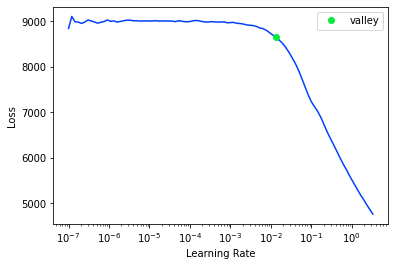

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0  101.62     102.16
1   85.14      85.50
2   95.63      96.28
3  108.17     107.27
4   75.99      76.29
XGBoost RMSE:  0.81170005


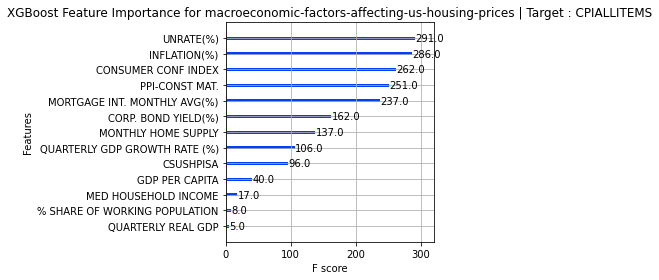

Target Variable: PPI-CONST MAT.
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'CONSUMER CONF INDEX', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'CONSUMER CONF INDEX', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


  2%|▏         | 1/42 [00:00<00:04,  9.78it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9894928669685661, 'Adjusted R-Squared': 0.9854754337506649, 'RMSE': 3.8670127044442144, 'Time taken': 0.10209965705871582}
{'Model': 'BaggingRegressor', 'R-Squared': 0.9947129006983377, 'Adjusted R-Squared': 0.9926913627300551, 'RMSE': 2.7431036441415477, 'Time taken': 0.03458428382873535}
{'Model': 'BayesianRidge', 'R-Squared': 0.9798127823156425, 'Adjusted R-Squared': 0.9720941402598587, 'RMSE': 5.360085490364018, 'Time taken': 0.01116180419921875}


 17%|█▋        | 7/42 [00:00<00:01, 31.17it/s]

{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.9937252203804878, 'Adjusted R-Squared': 0.9913260399377332, 'RMSE': 2.988358674982532, 'Time taken': 0.013268709182739258}
{'Model': 'DummyRegressor', 'R-Squared': -5.742189434854161e-05, 'Adjusted R-Squared': -0.3824323185010112, 'RMSE': 37.72645, 'Time taken': 0.00922846794128418}
{'Model': 'ElasticNet', 'R-Squared': 0.9678660922756924, 'Adjusted R-Squared': 0.9555795981458102, 'RMSE': 6.762624203827628, 'Time taken': 0.009494304656982422}
{'Model': 'ElasticNetCV', 'R-Squared': 0.9769997329582837, 'Adjusted R-Squared': 0.9682055132070392, 'RMSE': 5.721368526907973, 'Time taken': 0.06422781944274902}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.99217934112794, 'Adjusted R-Squared': 0.98918908920627, 'RMSE': 3.3362236359977655, 'Time taken': 0.01103067398071289}


 24%|██▍       | 10/42 [00:00<00:01, 23.47it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9962622705719179, 'Adjusted R-Squared': 0.9948331387317688, 'RMSE': 2.306414784855598, 'Time taken': 0.15264606475830078}
{'Model': 'GammaRegressor', 'R-Squared': 0.955785381225824, 'Adjusted R-Squared': 0.9388797916945214, 'RMSE': 7.932615894825499, 'Time taken': 0.012224674224853516}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.363691563910572, 'Adjusted R-Squared': 0.12039716187637894, 'RMSE': 30.093127416153266, 'Time taken': 0.027408599853515625}


 31%|███       | 13/42 [00:00<00:01, 14.84it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9961751721476622, 'Adjusted R-Squared': 0.9947127379688271, 'RMSE': 2.333132643398629, 'Time taken': 0.1796410083770752}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.9707481617840911, 'Adjusted R-Squared': 0.95956363540742, 'RMSE': 6.452233338402061, 'Time taken': 0.12729668617248535}
{'Model': 'HuberRegressor', 'R-Squared': 0.9743507229146107, 'Adjusted R-Squared': 0.9645436463819618, 'RMSE': 6.041865429774098, 'Time taken': 0.04102659225463867}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9671292555674714, 'Adjusted R-Squared': 0.954561029755034, 'RMSE': 6.839719, 'Time taken': 0.0103912353515625}


 40%|████      | 17/42 [00:00<00:01, 18.42it/s]

{'Model': 'KernelRidge', 'R-Squared': -28.970670545109904, 'Adjusted R-Squared': -40.43004457706369, 'RMSE': 206.52931911613004, 'Time taken': 0.03453230857849121}
{'Model': 'Lars', 'R-Squared': -2765.284936199186, 'Adjusted R-Squared': -3822.98211768711, 'RMSE': 1984.1839819863549, 'Time taken': 0.050455331802368164}
{'Model': 'LarsCV', 'R-Squared': 0.9791973790806155, 'Adjusted R-Squared': 0.9712434357879097, 'RMSE': 5.441172707134044, 'Time taken': 0.06966614723205566}
{'Model': 'Lasso', 'R-Squared': 0.9776976536795899, 'Adjusted R-Squared': 0.9691702859688449, 'RMSE': 5.633895161464089, 'Time taken': 0.010872840881347656}


 48%|████▊     | 20/42 [00:01<00:01, 18.30it/s]

{'Model': 'LassoCV', 'R-Squared': 0.9769788031890424, 'Adjusted R-Squared': 0.9681765808789704, 'RMSE': 5.723971098725406, 'Time taken': 0.07761859893798828}
{'Model': 'LassoLars', 'R-Squared': 0.8093727625768716, 'Adjusted R-Squared': 0.7364858776797931, 'RMSE': 16.47122730206565, 'Time taken': 0.012264728546142578}
{'Model': 'LassoLarsCV', 'R-Squared': 0.9803075034292102, 'Adjusted R-Squared': 0.9727780194462612, 'RMSE': 5.2939992163263785, 'Time taken': 0.03175830841064453}
{'Model': 'LassoLarsIC', 'R-Squared': 0.9804315627760293, 'Adjusted R-Squared': 0.972949513249217, 'RMSE': 5.277297226858698, 'Time taken': 0.01425480842590332}
{'Model': 'LinearRegression', 'R-Squared': 0.980536310895654, 'Adjusted R-Squared': 0.9730943121204628, 'RMSE': 5.263153820913223, 'Time taken': 0.009851932525634766}
{'Model': 'LinearSVR', 'R-Squared': 0.5538907692984856, 'Adjusted R-Squared': 0.3833195928537889, 'RMSE': 25.197304726662185, 'Time taken': 0.010024785995483398}


 71%|███████▏  | 30/42 [00:01<00:00, 18.42it/s]

{'Model': 'MLPRegressor', 'R-Squared': -22.79324690682542, 'Adjusted R-Squared': -31.89066484178808, 'RMSE': 184.01801391680507, 'Time taken': 0.4089939594268799}
{'Model': 'NuSVR', 'R-Squared': 0.4239027052620822, 'Adjusted R-Squared': 0.2036302102152313, 'RMSE': 28.63395916969206, 'Time taken': 0.025852441787719727}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.8821462694451664, 'Adjusted R-Squared': 0.8370845489389065, 'RMSE': 12.951055084608928, 'Time taken': 0.020294189453125}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.9675050115770962, 'Adjusted R-Squared': 0.9550804571801036, 'RMSE': 6.800513024272403, 'Time taken': 0.03208518028259277}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.9680511310143121, 'Adjusted R-Squared': 0.9558353869903725, 'RMSE': 6.74312526679963, 'Time taken': 0.020884275436401367}
{'Model': 'PoissonRegressor', 'R-Squared': 0.9815786717548637, 'Adjusted R-Squared': 0.9745352227199586, 'RMSE': 5.120282867518867, 'Time taken': 0.02

 79%|███████▊  | 33/42 [00:02<00:01,  6.69it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.00012446181740832785, 'Adjusted R-Squared': -0.38252499133582907, 'RMSE': 37.72771548358904, 'Time taken': 1.2278339862823486}
{'Model': 'RANSACRegressor', 'R-Squared': 0.9716046680703722, 'Adjusted R-Squared': 0.9607476293913968, 'RMSE': 6.357069482913614, 'Time taken': 0.061686038970947266}


 83%|████████▎ | 35/42 [00:03<00:01,  6.88it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9967228643965632, 'Adjusted R-Squared': 0.995469841959955, 'RMSE': 2.1596366525962165, 'Time taken': 0.239396333694458}
{'Model': 'Ridge', 'R-Squared': 0.9767124680829768, 'Adjusted R-Squared': 0.9678084117617621, 'RMSE': 5.756986552225919, 'Time taken': 0.011016130447387695}
{'Model': 'RidgeCV', 'R-Squared': 0.979319467928997, 'Adjusted R-Squared': 0.9714122056665547, 'RMSE': 5.425182316479827, 'Time taken': 0.011424541473388672}
{'Model': 'SGDRegressor', 'R-Squared': 0.9754466482078614, 'Adjusted R-Squared': 0.9660586019343966, 'RMSE': 5.911379981753636, 'Time taken': 0.012888193130493164}
{'Model': 'SVR', 'R-Squared': 0.4300263824510324, 'Adjusted R-Squared': 0.21209529338819189, 'RMSE': 28.4813689918747, 'Time taken': 0.012616634368896484}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.980536310895654, 'Adjusted R-Squared': 0.9730943121204628, 'RMSE': 5.263153820913223, 'Time taken': 0.009706974029541016}
{'Model': 'TweedieR

100%|██████████| 42/42 [00:03<00:00, 11.17it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9893377720680916, 'Adjusted R-Squared': 0.9852610378588325, 'RMSE': 3.8954487, 'Time taken': 0.41550421714782715}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9715496120729699, 'Adjusted R-Squared': 0.9606715225714584, 'RMSE': 6.363229391766886, 'Time taken': 0.05531191825866699}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: PPI-CONST MAT.
PPI-CONST MAT.
Target Standard Deviation: 41.03281021118164
                               Adjusted R-Squared  R-Squared    RMSE  \
Model                                                                  
RandomForestRegressor                        1.00       1.00    2.16   
ExtraTreesRegressor                          0.99       1.00    2.31   
GradientBoostingRegressor                    0.99       1.00    2.33   
BaggingRegressor                             0.99       0.99    2.74   
DecisionTreeRegressor                        0.99       0

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,45222.917969,44920.890625,211.945496,00:00
1,43798.531250,36895.457031,192.081909,00:00
2,41745.429688,20761.152344,144.087311,00:00
3,38115.066406,10583.494141,102.876114,00:00
4,32356.480469,135843.703125,368.569794,00:00


Better model found at epoch 0 with _rmse value: 211.94549560546875.
Better model found at epoch 1 with _rmse value: 192.0819091796875.
Better model found at epoch 2 with _rmse value: 144.08731079101562.
Better model found at epoch 3 with _rmse value: 102.87611389160156.
No improvement since epoch 3: early stopping


,UNRATE(%),CONSUMER CONF INDEX,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,PPI-CONST MAT.,PPI-CONST MAT._pred
0,-1.21,0.78,2.18,3.31,-0.85,-3.18,-1.17,-0.01,-6.85,2.32,1.88,-0.64,-1.36,343.58,506.52
1,-0.09,-0.40,-1.72,-0.04,1.24,-0.45,1.72,-1.03,0.16,-1.65,-1.74,-0.25,2.65,144.60,140.55
2,-0.62,0.31,-1.13,0.68,1.42,-0.19,0.83,-0.57,0.22,-0.90,-0.87,0.07,0.78,173.50,95.83
3,-0.30,0.49,-1.41,0.43,1.23,-0.32,1.25,-0.77,0.20,-1.24,-1.21,0.34,1.08,162.20,81.40
4,-1.26,1.72,1.15,-0.30,-0.98,1.25,-1.42,-0.21,0.00,1.38,1.52,0.15,-0.32,234.40,298.89
5,-0.57,0.02,-0.59,1.19,0.96,0.06,0.79,1.67,0.23,-0.50,-0.48,-0.65,0.19,184.30,104.47
6,2.05,-1.44,-0.34,0.03,0.24,-0.00,0.74,0.55,0.22,-0.57,-0.62,0.02,-0.29,193.70,96.74
7,0.93,-0.76,0.19,-0.16,-1.09,0.11,-0.94,-0.77,0.18,-0.12,-0.14,-0.22,-1.02,206.60,215.18
8,2.05,-1.24,-0.32,-0.02,0.36,-0.00,0.75,0.09,0.22,-0.50,-0.53,0.36,-0.30,196.50,59.05


<Figure size 432x288 with 0 Axes>

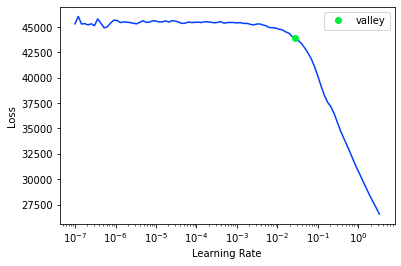

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0  237.00     237.88
1  236.30     235.87
2  232.40     238.80
3  206.60     205.64
4  160.10     154.85
XGBoost RMSE:  3.8961241


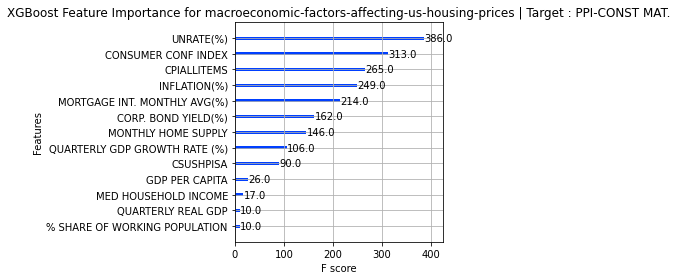

Target Variable: CONSUMER CONF INDEX
CATS=====================
[]
CONTS=====================
['UNRATE(%)', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
13
Looping through continuous variables to find breakpoint
Continuous variables that made the cut : ['UNRATE(%)', 'PPI-CONST MAT.', 'CPIALLITEMS', 'INFLATION(%)', 'MORTGAGE INT. MONTHLY AVG(%)', 'MED HOUSEHOLD INCOME', 'CORP. BOND YIELD(%)', 'MONTHLY HOME SUPPLY', '% SHARE OF WORKING POPULATION', 'GDP PER CAPITA', 'QUARTERLY REAL GDP', 'QUARTERLY GDP GROWTH RATE (%)', 'CSUSHPISA']
Categorical variables that made the cut : []
Tabular Object size: 241


  5%|▍         | 2/42 [00:00<00:02, 15.24it/s]

{'Model': 'AdaBoostRegressor', 'R-Squared': 0.9314797899748707, 'Adjusted R-Squared': 0.905280886141733, 'RMSE': 7.444599168753623, 'Time taken': 0.09702157974243164}
{'Model': 'BaggingRegressor', 'R-Squared': 0.9436187861674493, 'Adjusted R-Squared': 0.9220612632314741, 'RMSE': 6.753037906528575, 'Time taken': 0.03398728370666504}
{'Model': 'BayesianRidge', 'R-Squared': 0.8896220165177547, 'Adjusted R-Squared': 0.8474186698921904, 'RMSE': 9.44872489712748, 'Time taken': 0.01154637336730957}


 17%|█▋        | 7/42 [00:00<00:01, 30.74it/s]

{'Model': 'DecisionTreeRegressor', 'R-Squared': 0.9198733996131152, 'Adjusted R-Squared': 0.8892367582887181, 'RMSE': 8.050453302601316, 'Time taken': 0.011313915252685547}
{'Model': 'DummyRegressor', 'R-Squared': -0.03580299684888644, 'Adjusted R-Squared': -0.4318453191734606, 'RMSE': 28.9448, 'Time taken': 0.00871586799621582}
{'Model': 'ElasticNet', 'R-Squared': 0.7533495487141335, 'Adjusted R-Squared': 0.6590420232224787, 'RMSE': 14.124495153694534, 'Time taken': 0.009766101837158203}
{'Model': 'ElasticNetCV', 'R-Squared': 0.8828773802993901, 'Adjusted R-Squared': 0.8380952021785687, 'RMSE': 9.733126449632508, 'Time taken': 0.07348513603210449}
{'Model': 'ExtraTreeRegressor', 'R-Squared': 0.9014151970027092, 'Adjusted R-Squared': 0.8637210076213921, 'RMSE': 8.929701943551658, 'Time taken': 0.010879993438720703}


 26%|██▌       | 11/42 [00:00<00:01, 23.70it/s]

{'Model': 'ExtraTreesRegressor', 'R-Squared': 0.9478011251492444, 'Adjusted R-Squared': 0.9278427318239555, 'RMSE': 6.497743263780062, 'Time taken': 0.15379786491394043}
{'Model': 'GammaRegressor', 'R-Squared': 0.6844369842564472, 'Adjusted R-Squared': 0.5637805370603828, 'RMSE': 15.976256540986904, 'Time taken': 0.012617349624633789}
{'Model': 'GaussianProcessRegressor', 'R-Squared': 0.8954727203590297, 'Adjusted R-Squared': 0.8555064075551293, 'RMSE': 9.194895560135443, 'Time taken': 0.031789541244506836}


 33%|███▎      | 14/42 [00:00<00:01, 14.95it/s]

{'Model': 'GradientBoostingRegressor', 'R-Squared': 0.9519583009778572, 'Adjusted R-Squared': 0.9335894160576261, 'RMSE': 6.233631935258602, 'Time taken': 0.18271183967590332}
{'Model': 'HistGradientBoostingRegressor', 'R-Squared': 0.93619479468281, 'Adjusted R-Squared': 0.9117986867674138, 'RMSE': 7.1838959256155945, 'Time taken': 0.12136149406433105}
{'Model': 'HuberRegressor', 'R-Squared': 0.8854492602090446, 'Adjusted R-Squared': 0.8416504479360323, 'RMSE': 9.625669054851288, 'Time taken': 0.03924059867858887}
{'Model': 'KNeighborsRegressor', 'R-Squared': 0.9143429196501419, 'Adjusted R-Squared': 0.8815916830457844, 'RMSE': 8.323647, 'Time taken': 0.012265443801879883}
{'Model': 'KernelRidge', 'R-Squared': -9.334648915610384, 'Adjusted R-Squared': -13.286132324520235, 'RMSE': 91.42813071184165, 'Time taken': 0.028516769409179688}


 50%|█████     | 21/42 [00:01<00:01, 19.21it/s]

{'Model': 'Lars', 'R-Squared': 0.8917523947308483, 'Adjusted R-Squared': 0.8503636044808786, 'RMSE': 9.357096867025085, 'Time taken': 0.04735279083251953}
{'Model': 'LarsCV', 'R-Squared': 0.8940544518511377, 'Adjusted R-Squared': 0.8535458599118668, 'RMSE': 9.257065419596119, 'Time taken': 0.07790422439575195}
{'Model': 'Lasso', 'R-Squared': 0.8512265565603506, 'Adjusted R-Squared': 0.7943425928922494, 'RMSE': 10.969698324622255, 'Time taken': 0.011890888214111328}
{'Model': 'LassoCV', 'R-Squared': 0.893038708257337, 'Adjusted R-Squared': 0.8521417437674953, 'RMSE': 9.301335213438628, 'Time taken': 0.09691762924194336}
{'Model': 'LassoLars', 'R-Squared': 0.2313805757515025, 'Adjusted R-Squared': -0.06250332175527595, 'RMSE': 24.933753092261913, 'Time taken': 0.009703397750854492}
{'Model': 'LassoLarsCV', 'R-Squared': 0.8925840081530249, 'Adjusted R-Squared': 0.8515131877409461, 'RMSE': 9.321084567471384, 'Time taken': 0.031374454498291016}
{'Model': 'LassoLarsIC', 'R-Squared': 0.891129

 71%|███████▏  | 30/42 [00:01<00:00, 18.03it/s]

{'Model': 'MLPRegressor', 'R-Squared': -4.958000904364796, 'Adjusted R-Squared': -7.236060073680747, 'RMSE': 69.41962433405303, 'Time taken': 0.4065227508544922}
{'Model': 'NuSVR', 'R-Squared': 0.47187932798631826, 'Adjusted R-Squared': 0.2699508357457929, 'RMSE': 20.66800511543524, 'Time taken': 0.02653336524963379}
{'Model': 'OrthogonalMatchingPursuit', 'R-Squared': 0.7049603318205099, 'Adjusted R-Squared': 0.592151046928352, 'RMSE': 15.447997205752095, 'Time taken': 0.021626710891723633}
{'Model': 'OrthogonalMatchingPursuitCV', 'R-Squared': 0.7735440161632192, 'Adjusted R-Squared': 0.6869579046962149, 'RMSE': 13.533928482185289, 'Time taken': 0.031183242797851562}
{'Model': 'PassiveAggressiveRegressor', 'R-Squared': 0.7850004606935441, 'Adjusted R-Squared': 0.7027947544881346, 'RMSE': 13.187143781937582, 'Time taken': 0.019791126251220703}
{'Model': 'PoissonRegressor', 'R-Squared': 0.8708912833817268, 'Adjusted R-Squared': 0.8215261858512106, 'RMSE': 10.21903199289563, 'Time taken':

 79%|███████▊  | 33/42 [00:03<00:01,  6.18it/s]

{'Model': 'QuantileRegressor', 'R-Squared': -0.11394056784290907, 'Adjusted R-Squared': -0.539859020253433, 'RMSE': 30.016702922490218, 'Time taken': 1.2430963516235352}
{'Model': 'RANSACRegressor', 'R-Squared': 0.11341665662724099, 'Adjusted R-Squared': -0.2255710923094021, 'RMSE': 26.778840013429132, 'Time taken': 0.14484691619873047}


 83%|████████▎ | 35/42 [00:03<00:01,  6.56it/s]

{'Model': 'RandomForestRegressor', 'R-Squared': 0.9502487418250054, 'Adjusted R-Squared': 0.9312262019345663, 'RMSE': 6.34357400631382, 'Time taken': 0.2173609733581543}
{'Model': 'Ridge', 'R-Squared': 0.8872268341513789, 'Adjusted R-Squared': 0.8441076825033768, 'RMSE': 9.550692510652839, 'Time taken': 0.009916305541992188}
{'Model': 'RidgeCV', 'R-Squared': 0.8909145797624785, 'Adjusted R-Squared': 0.8492054484951908, 'RMSE': 9.393238106097751, 'Time taken': 0.010012626647949219}
{'Model': 'SGDRegressor', 'R-Squared': 0.8837506256606013, 'Adjusted R-Squared': 0.8393023354720076, 'RMSE': 9.696774336792378, 'Time taken': 0.015190839767456055}
{'Model': 'SVR', 'R-Squared': 0.5135389534293946, 'Adjusted R-Squared': 0.3275391415053396, 'RMSE': 19.83608733054634, 'Time taken': 0.01273202896118164}
{'Model': 'TransformedTargetRegressor', 'R-Squared': 0.8920900599780593, 'Adjusted R-Squared': 0.8508303770284938, 'RMSE': 9.342491304895956, 'Time taken': 0.01093745231628418}
{'Model': 'TweedieR

100%|██████████| 42/42 [00:03<00:00, 10.93it/s]

{'Model': 'XGBRegressor', 'R-Squared': 0.9465848553887859, 'Adjusted R-Squared': 0.9261614177433217, 'RMSE': 6.573008, 'Time taken': 0.41937732696533203}
{'Model': 'LGBMRegressor', 'R-Squared': 0.9411196238279822, 'Adjusted R-Squared': 0.9186065388210343, 'RMSE': 6.901083222076725, 'Time taken': 0.04521441459655762}
Project: macroeconomic-factors-affecting-us-housing-prices
macroeconomic-factors-affecting-us-housing-prices
Target: CONSUMER CONF INDEX
CONSUMER CONF INDEX
Target Standard Deviation: 25.007410049438477
                               Adjusted R-Squared  R-Squared  RMSE  Time Taken
Model                                                                         
GradientBoostingRegressor                    0.93       0.95  6.23        0.18
RandomForestRegressor                        0.93       0.95  6.34        0.22
ExtraTreesRegressor                          0.93       0.95  6.50        0.15
XGBRegressor                                 0.93       0.95  6.57        0.42
Baggi

LEARNING RATE: 0.1


epoch,train_loss,valid_loss,_rmse,time
0,9265.890625,8096.727051,89.981812,00:00
1,8788.920898,4995.582520,70.679436,00:00
2,7969.980957,1966.584839,44.346191,00:00
3,6765.047852,8845.989258,94.053116,00:00


Better model found at epoch 0 with _rmse value: 89.9818115234375.
Better model found at epoch 1 with _rmse value: 70.67943572998047.
Better model found at epoch 2 with _rmse value: 44.34619140625.
No improvement since epoch 2: early stopping


,UNRATE(%),PPI-CONST MAT.,CPIALLITEMS,INFLATION(%),MORTGAGE INT. MONTHLY AVG(%),MED HOUSEHOLD INCOME,CORP. BOND YIELD(%),MONTHLY HOME SUPPLY,% SHARE OF WORKING POPULATION,GDP PER CAPITA,QUARTERLY REAL GDP,QUARTERLY GDP GROWTH RATE (%),CSUSHPISA,CONSUMER CONF INDEX,CONSUMER CONF INDEX_pred
0,-0.47,0.05,0.35,-1.09,-0.63,0.44,-0.32,-0.25,0.14,0.37,0.49,-0.21,-0.47,90.40,41.88
1,-1.11,0.70,0.94,0.10,0.14,0.86,-0.25,0.56,0.07,1.10,1.23,-0.16,0.20,137.90,58.20
2,0.33,0.01,0.19,-0.50,-0.18,0.26,0.18,-0.42,0.18,0.05,0.05,0.15,-0.84,78.10,20.00
3,-1.01,0.69,0.90,-0.47,-0.17,1.20,-0.44,0.51,0.04,1.15,1.29,0.07,0.08,120.20,156.19
4,-0.32,-1.04,-1.47,0.18,1.05,-0.32,1.11,-0.91,0.21,-1.30,-1.28,0.29,1.15,105.70,113.11
5,1.08,-0.09,0.05,0.17,-0.62,0.10,-0.39,-0.58,0.20,-0.25,-0.27,0.21,-0.87,70.20,20.49
6,0.88,-0.39,-0.64,-1.37,0.33,0.02,0.57,3.39,0.24,-0.71,-0.85,-1.04,0.01,37.70,55.62
7,1.67,-0.38,-0.36,-0.70,-0.38,-0.01,0.23,1.21,0.23,-0.47,-0.49,0.03,-0.34,50.20,19.19
8,-0.17,-1.54,-1.78,-0.19,1.26,-0.44,1.71,-1.07,0.18,-1.71,-1.81,-0.22,2.91,93.70,93.50


<Figure size 432x288 with 0 Axes>

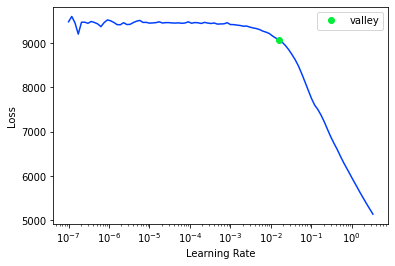

<Figure size 720x720 with 0 Axes>

XGBoost Predictions vs Actual==========
   actual  predicted
0   25.00      33.66
1  107.50     109.39
2   81.00      82.39
3   88.50      91.62
4  125.90     128.73
XGBoost RMSE:  6.57319


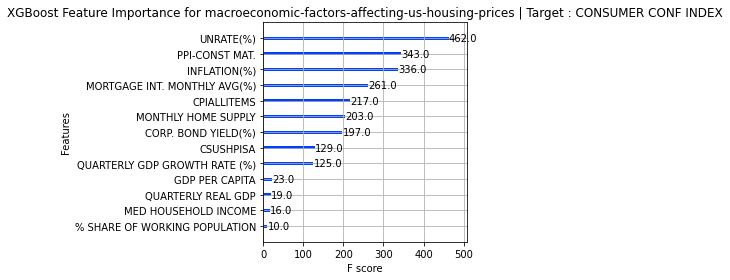

<Figure size 432x288 with 0 Axes>

In [22]:
target = ''
target_str = ''
#The column closest to the end isPARAM_DIR the target variable that can be represented as a float is the target variable
targets = []
#Loop through every possible target column (Continuous)
for i in range(len(df.columns)-1, 0, -1):
    try:
        df[df.columns[i]] = df[df.columns[i]].apply(pd.to_numeric, errors='coerce').dropna()
        target = df.columns[i]
        target_str = target.replace('/', '-')
    except:
        continue
    print(f'Target Variable: {target}')
    #Will be determined by the file name


    #===================================================================================================

    #Create project config files if they don't exist.
    if not os.path.exists(param_dir):
        #create param_dir
        os.makedirs(PARAM_DIR)
    if not os.path.exists(f'{PARAM_DIR}/cats.txt'):
        #create param_dir
        with open(f'{PARAM_DIR}/cats.txt', 'w') as f:
            f.write('')
    if not os.path.exists(f'{PARAM_DIR}/conts.txt'):
        #create param_dir
        with open(f'{PARAM_DIR}/conts.txt', 'w') as f:
            f.write('')
    if not os.path.exists(f'{PARAM_DIR}/cols_to_delete.txt'):
        with open(f'{PARAM_DIR}/cols_to_delete.txt', 'w') as f:
            f.write('')

    df = df.drop_duplicates()
    if SHUFFLE_DATA:
        df = df.sample(frac=1).reset_index(drop=True)

    # workaround for fastai/pytorch bug where bool is treated as object and thus erroring out.
    for n in df:
        if pd.api.types.is_bool_dtype(df[n]):
            df[n] = df[n].astype('uint8')

    with open(f'{PARAM_DIR}/cols_to_delete.txt', 'r') as f:
        cols_to_delete = f.read().splitlines()
    for col in cols_to_delete:
        try:
            del(df[col])
        except:
            pass
    #try to fill in missing values now, otherwise FastAI will do it for us later
    try:
        df = df.fillna(0)
    except:
        pass
    #print missing values
    #print(df.isna().sum().sort_values(ascending=False))
    #shrink df as much as possible
    df = df_shrink(df)


    #print types inside of df
    #print(df.dtypes)


    #Auto detect categorical and continuous variables
    #==============================================================================
    likely_cat = {}
    for var in df.columns:
        likely_cat[var] = 1.*df[var].nunique()/df[var].count() < 0.05 #or some other threshold

    cats = [var for var in df.columns if likely_cat[var]]
    conts = [var for var in df.columns if not likely_cat[var]]

    #remove target from lists
    try:
        conts.remove(target)
        cats.remove(target)
    except:
        pass
    #Convert target to float
    df[target] = df[target].apply(pd.to_numeric, errors='coerce').dropna()

    print('CATS=====================')
    print(cats)
    print('CONTS=====================')
    print(conts)

    #Populate categorical and continuous lists
    #==============================================================================

    if VARIABLE_FILES == True:
        with open(f'{PARAM_DIR}/cats.txt', 'r') as f:
            cats = f.read().splitlines()

        with open(f'{PARAM_DIR}/conts.txt', 'r') as f:
            conts = f.read().splitlines()

    #==============================================================================

    #==============================================================================
    procs = [Categorify, FillMissing, Normalize]
    #print(df.describe().T)
    df = df[0:SAMPLE_COUNT]
    splits = RandomSplitter()(range_of(df))

    print((len(cats)) + len(conts))
    #conts = []

    #Convert cont variables to floats
    #==============================================================================

    #Convert cont variables to floats
    #==============================================================================

    for var in conts:
        try:
            df[var] = df[var].apply(pd.to_numeric, errors='coerce').dropna()
        except:
            print(f'Could not convert {var} to float.')
            pass

    #==============================================================================

    #Experimental logic to add columns one-by-one to find a breakpoint
    #==============================================================================
    if ENABLE_BREAKPOINT == True:
        temp_procs = [Categorify, FillMissing]
        print('Looping through continuous variables to find breakpoint')
        cont_list = []
        for cont in conts:
            focus_cont = cont
            cont_list.append(cont)
            #print(focus_cont)
            try:
                to = TabularPandas(df, procs=procs, cat_names=cats, cont_names=cont_list, y_names=target, y_block=RegressionBlock(), splits=splits)
                del(to)
            except:
                print('Error with ', focus_cont)
                #remove focus_cont from list
                cont_list.remove(focus_cont)
                #traceback.print_exc()
                continue
        #convert all continuous variables to floats
        for var in cont_list:
            try:
                df[var] = df[var].apply(pd.to_numeric, errors='coerce').dropna()
            except:
                print(f'Could not convert {var} to float.')
                cont_list.remove(var)
                if CONVERT_TO_CAT == True:
                    cats.append(var)
                pass
        print(f'Continuous variables that made the cut : {cont_list}')
        print(f'Categorical variables that made the cut : {cats}')
        #shrink df as much as possible
        df = df_shrink(df)
        #print(df.dtypes)

    #==============================================================================

    #Creating tabular object + quick preprocessing
    #==============================================================================
    to = None
    if REGRESSOR == True:
        try:
            to = TabularPandas(df, procs, cats, conts, target, y_block=RegressionBlock(), splits=splits)
        except:
            conts = []
            to = TabularPandas(df, procs, cats, conts, target, y_block=RegressionBlock(), splits=splits)
    else:
        try:
            to = TabularPandas(df, procs, cats, conts, target, splits=splits)
        except:
            conts = []
            to = TabularPandas(df, procs, cats, conts, target, splits=splits)

    #print(dir(to))
    #print(to.xs)
    dls = to.dataloaders()
    print(f'Tabular Object size: {len(to)}')
    try:
        dls.one_batch()
    except:
        print(f'problem with getting one batch of {PROJECT_NAME}')
    #==============================================================================

    #Extracting train and test sets from tabular object
    #==============================================================================

    X_train, y_train = to.train.xs, to.train.ys.values.ravel()
    X_test, y_test = to.valid.xs, to.valid.ys.values.ravel()

    #Make sure target isn't in independent columns
    if target in X_train and target in X_test:
        del(X_train[target])
        del(X_test[target])
    #create dataframe from X_train and y_train
    #export tabular object to csv
    pd.DataFrame(X_train).to_csv(f'{PARAM_DIR}/X_train_{target_str}.csv', index=False)
    pd.DataFrame(X_test).to_csv(f'{PARAM_DIR}/X_test_{target_str}.csv', index=False)
    pd.DataFrame(y_train).to_csv(f'{PARAM_DIR}/y_train_{target_str}.csv', index=False)
    pd.DataFrame(y_test).to_csv(f'{PARAM_DIR}/y_test_{target_str}.csv', index=False)

    #==============================================================================

    #==============================================================================

    #Ready for model selection!

    if REGRESSOR == True:
        try:
            reg = LazyRegressor(verbose=2, ignore_warnings=False, custom_metric=None)
            models, predictions = reg.fit(X_train, X_test, y_train, y_test)
            print(f'Project: {PROJECT_NAME}')
            print(PROJECT_NAME)
            print(f'Target: {target}')
            print(target)
            target_std = y_train.std()
            print(f'Target Standard Deviation: {target_std}')
            print(models)
            models['project'] = PROJECT_NAME
            models['target'] = target
            models['target_std'] = target_std
            #rename index of 
            models.to_csv(f'{PARAM_DIR}/regression_results_{target_str}.csv', mode='a', header=True, index=True)
        except:
            print('Issue during lazypredict analysis')
    else:
        #TODO: remove this
        try:
            clf = LazyClassifier(verbose=2, ignore_warnings=False, custom_metric=None)
            models, predictions = clf.fit(X_train, X_test, y_train, y_test)
            print(f'Project: {PROJECT_NAME}')
            print(PROJECT_NAME)
            print(f'Target: {target}')
            print(target)
            print(f'Target Standard Deviation: {y_train.std()}')
            print(models)
            models.to_csv(f'{PARAM_DIR}/classification_results.csv', mode='a', header=False)
        except:
            print('Issue during lazypredict analysis')

    model_name = 'tabnet'

    # FastAI + pre-trained TabNet
    #==============================================================================
    learn = None
    i = 0
    while True:
        try:
            del learn
        except:
            pass
        try:
            learn = 0
            model = TabNetModel(get_emb_sz(to), len(to.cont_names), dls.c, n_d=64, n_a=64, n_steps=5, virtual_batch_size=256)
            # save the best model so far, determined by early stopping
            cbs = [SaveModelCallback(monitor='_rmse', comp=np.less, fname=f'{model_name}_{PROJECT_NAME}_{target_str}_best'), EarlyStoppingCallback()]
            learn = Learner(dls, model, loss_func=MSELossFlat(), metrics=rmse, cbs=cbs)
            #learn = get_learner(to)
            if(learn != 0):
                break
            if i > 50:
                break
        except:
            i += 1
            print('Error in FastAI TabNet')
            traceback.print_exc()
            continue
    try:
        #display learning rate finder results
        x = learn.lr_find()
    except:
        pass
    if AUTO_ADJUST_LEARNING_RATE == True:
        FASTAI_LEARNING_RATE = x.valley
    print(f'LEARNING RATE: {FASTAI_LEARNING_RATE}')
    try:
        if i < 50:
            learn.fit_one_cycle(20, FASTAI_LEARNING_RATE)
            plt.figure(figsize=(10, 10))
            try:
                ax = learn.show_results()
                plt.show(block=True)
            except:
                print('Could not show results')
                pass
    except:
        print('Could not fit model')
        traceback.print_exc()
        pass

    #==============================================================================

    #fit an xgboost model
    #==============================================================================
    if REGRESSOR == True:
        xgb = XGBRegressor()
    else:
        xgb = XGBClassifier()
    try:
        xgb = XGBRegressor()
        xgb.fit(X_train, y_train)
        y_pred = xgb.predict(X_test)
        print('XGBoost Predictions vs Actual==========')
        print(pd.DataFrame({'actual': y_test, 'predicted': y_pred}).head())
        print('XGBoost RMSE: ', np.sqrt(mean_squared_error(y_test, y_pred)))
        #save feature importance plot to file
        plot_importance(xgb)
        plt.title(f'XGBoost Feature Importance for {PROJECT_NAME} | Target : {target}', wrap=True)
        plt.tight_layout()
        plt.show()
        plt.savefig(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.png')
        fi_df = pd.DataFrame([xgb.get_booster().get_score()]).T
        fi_df.columns = ['importance']
        #create a column based off the index called feature
        fi_df['feature'] = fi_df.index
        #create a dataframe of feature importance
        fi_df = fi_df[['feature', 'importance']]
        fi_df.to_csv(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.csv', index=False)
        #xgb_fi = pd.DataFrame(xgb.feature_importances_, index=X_train.columns, columns=['importance'])
        #xgb_fi.to_csv(f'{PARAM_DIR}/xgb_feature_importance_{target_str}.csv')
        #print('XGBoost AUC: ', roc_auc_score(y_test, y_pred))
    except:
        traceback.print_exc()
        print('XGBoost failed')

# <div style="text-align: center; background-color: blue; color: white; padding: 14px; line-height: 1;border-radius:20px">**Overall Feature Importance**</div>

               feature  importance
0            UNRATE(%)      216.00
1  CONSUMER CONF INDEX      269.00
2       PPI-CONST MAT.      147.00
3          CPIALLITEMS      101.00
4         INFLATION(%)      199.00


<AxesSubplot:title={'center':'XGBoost Overall Feature Importance'}, xlabel='feature'>

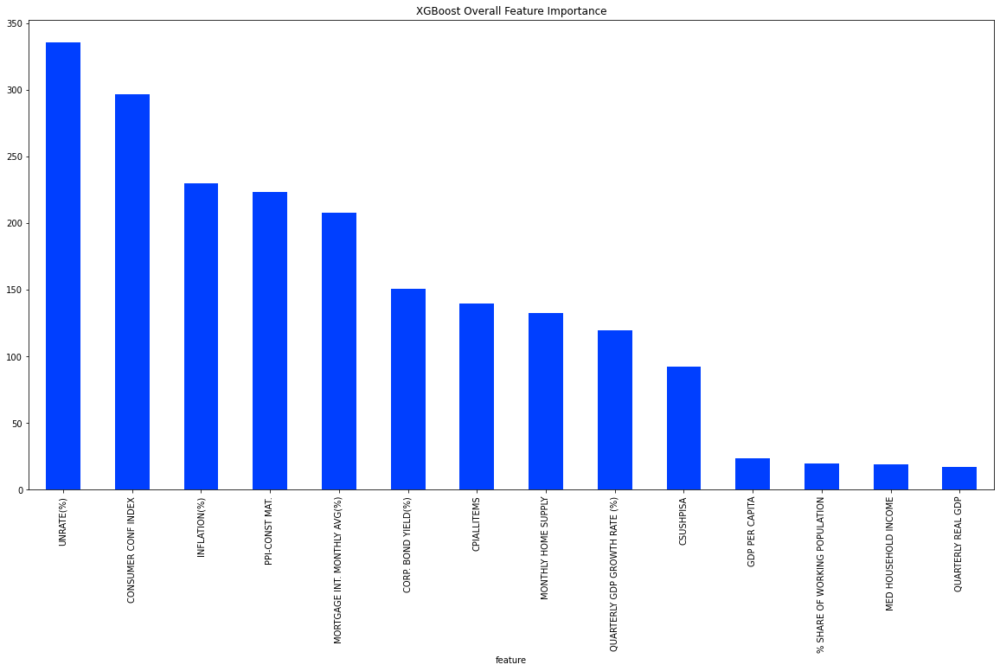

In [23]:
out_dir = f'./{PROJECT_NAME}'
xgb_feature_importance_csvs = []

for file in os.listdir(out_dir):
    if 'xgb_feature_importance' in file and '.csv' in file:
        xgb_feature_importance_csvs.append(pd.read_csv(os.path.join(out_dir, file)))

xgb_feature_importance = pd.concat(xgb_feature_importance_csvs,axis=0)
xgb_feature_importance.rename(columns={'Unnamed: 0': 'feature'}, inplace=True)
print(xgb_feature_importance.head())
xgb_feature_importance.groupby('feature')['importance'].mean().sort_values(ascending=False).plot(kind='bar', title='XGBoost Overall Feature Importance', figsize=(20, 10))

In [24]:
df.isna().sum()

UNRATE(%)                        0
CONSUMER CONF INDEX              0
PPI-CONST MAT.                   0
CPIALLITEMS                      0
INFLATION(%)                     0
MORTGAGE INT. MONTHLY AVG(%)     0
MED HOUSEHOLD INCOME             0
CORP. BOND YIELD(%)              0
MONTHLY HOME SUPPLY              0
% SHARE OF WORKING POPULATION    0
GDP PER CAPITA                   0
QUARTERLY REAL GDP               0
QUARTERLY GDP GROWTH RATE (%)    0
CSUSHPISA                        0
dtype: int64

# **To Be Continued...**